### Twitter Scrapping

#### Objective:
To use Twitter's API to pull tweets (based within Singapore) that contain words related to mental wellness as contributed by our responsdents

#### Resources:
- words_list = ['stress', 'pressure', 'mental tension', 'mental strain', 'overworked', 'frustration', 'tired', 'depressed', 'sad', 'dejected', 'despair', 'antidepressant', 'burnout', 'emptiness', 'insomnia', 'depression', 'suicide', 'samaritans of singapore', 'sos', 'die', 'burden', 'worthlessness', 'anxiety', 'worry', 'apprehension', 'distress', 'panic', 'hyperventilation', 'helpless', 'hyperventilate', 'love for oneself', 'self care', 'good social relationships', 'emotional regulations', 'social anxiety', 'mental health', 'mental illness', 'able to cope', 'social wellbeing', 'get help', 'healthy thoughts', 'excellent mental health', 'too much work', 'understanding surroundings', 'level of stress', 'unsound mind', 'pressuring environments', 'well being', 'stress management', 'treat yourself', 'no money', 'articulating thoughts', 'emotional wellbeing', 'practice care', 'sleep deprivation', 'mentally unwell', 'coping mechanism', 'social stigma', 'able to manage emotions', 'mood swings', 'self actualization', 'positive mindset', 'always reach out', 'therapy', 'peace', 'crazy', 'stigma', 'imh', 'insane', 'stress-free', 'bullying', 'self-being', 'anger', 'undepressed', 'counselling', 'disorder', 'meditation', 'psychological', 'resilience', 'confusion', 'psychology', 'contentment', 'struggle', 'bipolar', 'counsellor', 'insecurities', 'self-care', 'sanity', 'messy', 'lonely', 'spirituality', 'depress', 'serenity', 'warmth', 'dissatisfaction', 'unanxious']
- datacamp.com for Network Analysis Part 1
- Twitter Developers


In [1]:
# Import Datasets

import pandas as pd
import numpy as np
import re
import matplotlib.pyplot as plt

In [2]:
# setting up of tokens for Twitter API queries 

import tweepy
consumer_key = "ZfzWdOklPDvm0DZhFi71rbVGD"
consumer_secret = "9mgESbeQ4L0xU5dxuc3Xwpz3CoUPCmsD5qoHm44XS1Lb5zYEVB"
access_token = "1231231575964012547-cnvVh6ckjKNRY02f58vIm1oEpPn9eP"
access_token_secret = "gCCBJwnUAFcdI9IbJfZrDac73rIgmUucpnSasZFMSRBFn"

In [3]:
# These are the object assignment that will be used
# Note: do not delete this as this would be the basis of our developments

# Creating the authentication object
auth = tweepy.OAuthHandler(consumer_key, consumer_secret)
# Setting your access token and secret
auth.set_access_token(access_token, access_token_secret)
# Creating the API object while passing in auth information
api = tweepy.API(auth)

### 1. [EDA Step] Pulling of tweet contents

In [111]:
# Define a function that will take our search query, a limit of 1000 tweets by default, default to english language
#and allow us to pass a list of words to remove from the string
def tweetSearch_contents(query, limit = 1000, language = "en", remove = []):
    
    #Create a blank variable
    text = []
    
    #Iterate through Twitter using Tweepy to find our query in our lreanguage, with our defined limit
    #For every tweet that has our query, add it to our text holder in lower case
    for tweet in tweepy.Cursor(api.search, q=query,geocode="1.290270,103.851959,10mi", lang=language, tweet_mode= 'extended').items(limit):
        text.append(tweet)
    
    #return our clean text
    return text

In [365]:
# results = tweetSearch_attributes(query = "depression -filter:retweets", limit = 10)
results = tweetSearch_contents(query = "depression", limit = 1)
results

[Status(_api=<tweepy.api.API object at 0x11f4cbf50>, _json={'created_at': 'Sun Mar 15 13:13:53 +0000 2020', 'id': 1239178005286510592, 'id_str': '1239178005286510592', 'full_text': 'RT @Daraljoshua: @narendaran49 @vneshramos deep deep depression bro', 'truncated': False, 'display_text_range': [0, 67], 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'Daraljoshua', 'name': 'Daral & Joshua', 'id': 454894547, 'id_str': '454894547', 'indices': [3, 15]}, {'screen_name': 'narendaran49', 'name': 'narendaran', 'id': 1233264544086052865, 'id_str': '1233264544086052865', 'indices': [17, 30]}, {'screen_name': 'vneshramos', 'name': 'Vneshramos', 'id': 1238630801861775360, 'id_str': '1238630801861775360', 'indices': [31, 42]}], 'urls': []}, 'metadata': {'iso_language_code': 'en', 'result_type': 'recent'}, 'source': '<a href="http://twitter.com/download/android" rel="nofollow">Twitter for Android</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in

### 2. Function Definition


1) user_mention_collation
This is to split up the list in df cells into a string

2) tweetSearch_queries
This is to query for tweets based on a list of queries, and then returns an output in the form of a dataframe

In [336]:
# engineering new functions
def user_mention_collation(value):
        user_mention = []
        
        for n in range(0, len(value)):
            user_mention.append(",".join([test['screen_name'] for test in value[n]]))
            
        return user_mention
    

    
    
def tweetSearch_queries(queries, limit = 1000, language = "en", remove = []):
    
    #Create a blank variable
    text = [] # this is the 
    user_account = []
    temp_user_mention = []

    ## Iterate through Twitter using Tweepy to find our query in our language, with our defined limit ##
    ## For every tweet that has our query, add it to our text holder ##
    for query in queries:
        for tweet in tweepy.Cursor(api.search, q=query,geocode="1.290270,103.851959,10mi", lang=language, tweet_mode= 'extended', show_user = True).items(limit):
            text.append(tweet.full_text)
            user_account.append(tweet.user.screen_name)
            temp_user_mention.append(tweet.entities["user_mentions"])
            actual_user_mention = user_mention_collation(temp_user_mention)

    final_dataframe = pd.DataFrame({"Text": text, "User Account": user_account, "Mentions": actual_user_mention})
    
    ## Removal of duplicated Tweets, if any##
    outcome_text_UA = final_dataframe.copy()
    outcome_text_UA["key"] = outcome_text_UA['Text']+outcome_text_UA['User Account']
    final_dataframe = final_dataframe[np.invert(outcome_text_UA.duplicated('key', keep = 'first'))]
    final_dataframe.reset_index(inplace = True,drop=True)
    
    ## Adding of Retweets Column ##
    final_dataframe["Retweets"] = ''
    for i in range(0,len(final_dataframe)):
        if re.search("RT @\w+",final_dataframe["Text"][i]):
            final_dataframe["Retweets"][i] = final_dataframe["Mentions"][i].split(",")[0]
        else:
            final_dataframe["Retweets"][i] = ""

    ## Splitting of Mentions to create multiple rows of one unique twitter account to one unique mention ##
    mentions = pd.DataFrame(final_dataframe.Mentions.str.split(",", expand = True))
    d1 = final_dataframe.merge(right = mentions, left_index = True, right_index = True)
    d1 = d1.drop("Mentions", axis = 1)
    d2 = d1.melt(id_vars = ['Text', 'User Account','Retweets'], value_name = "Mentions")
    dataframe = d2.dropna(subset = ['Mentions'])
    
    #return our clean text
    return dataframe



def tweetSearch_rawQueries(queries, limit = 1000, language = "en", remove = []):
    
     #Create a blank variable
    text = [] # this is the 
    user_account = []
    temp_user_mention = []

    ## Iterate through Twitter using Tweepy to find our query in our language, with our defined limit ##
    ## For every tweet that has our query, add it to our text holder ##
    for query in queries:
        for tweet in tweepy.Cursor(api.search, q=query,geocode="1.290270,103.851959,10mi", lang=language, tweet_mode= 'extended', show_user = True).items(limit):
            text.append(tweet.full_text)
            user_account.append(tweet.user.screen_name)
            temp_user_mention.append(tweet.entities["user_mentions"])
            actual_user_mention = user_mention_collation(temp_user_mention)

    final_dataframe = pd.DataFrame({"Text": text, "User Account": user_account, "Mentions": actual_user_mention})
    
    return final_dataframe


def tweetSearch_dataframe(final_dataframe):
    
    """ This function assumes that you've appended all tweetSearch_rawQueries output into a single dataframe! """
    
    ## Removal of duplicated Tweets, if any##
    outcome_text_UA = final_dataframe.copy()
    outcome_text_UA["key"] = outcome_text_UA['Text']+outcome_text_UA['User Account']
    final_dataframe = final_dataframe[np.invert(outcome_text_UA.duplicated('key', keep = 'first'))]
    final_dataframe.reset_index(inplace = True,drop=True)
    
    ## Adding of Retweets Column ##
    final_dataframe["Retweets"] = ''
    for i in range(0,len(final_dataframe)):
        if re.search("RT @\w+",final_dataframe["Text"][i]):
            final_dataframe["Retweets"][i] = final_dataframe["Mentions"][i].split(",")[0]
        else:
            final_dataframe["Retweets"][i] = ""

    ## Splitting of Mentions to create multiple rows of one unique twitter account to one unique mention ##
    mentions = pd.DataFrame(final_dataframe.Mentions.str.split(",", expand = True))
    d1 = final_dataframe.merge(right = mentions, left_index = True, right_index = True)
    d1 = d1.drop("Mentions", axis = 1)
    d2 = d1.melt(id_vars = ['Text', 'User Account','Retweets'], value_name = "Mentions")
    dataframe = d2.dropna(subset = ['Mentions'])
    
    #return our clean text
    return dataframe


In [337]:
words_list = ['stress', 'pressure', 'mental tension', 'mental strain', 'overworked', 'frustration', 'tired', 'depressed', 'sad', 'dejected', 'despair', 'antidepressant', 'burnout', 'emptiness', 'insomnia', 'depression', 'suicide', 'samaritans of singapore', 'sos', 'die', 'burden', 'worthlessness', 'anxiety', 'worry', 'apprehension', 'distress', 'panic', 'hyperventilation', 'helpless', 'hyperventilate', 'love for oneself', 'self care', 'good social relationships', 'emotional regulations', 'social anxiety', 'mental health', 'mental illness', 'able to cope', 'social wellbeing', 'get help', 'healthy thoughts', 'excellent mental health', 'too much work', 'understanding surroundings', 'level of stress', 'unsound mind', 'pressuring environments', 'well being', 'stress management', 'treat yourself', 'no money', 'articulating thoughts', 'emotional wellbeing', 'practice care', 'sleep deprivation', 'mentally unwell', 'coping mechanism', 'social stigma', 'able to manage emotions', 'mood swings', 'self actualization', 'positive mindset', 'always reach out', 'therapy', 'peace', 'crazy', 'stigma', 'imh', 'insane', 'stress-free', 'bullying', 'self-being', 'anger', 'undepressed', 'counselling', 'disorder', 'meditation', 'psychological', 'resilience', 'confusion', 'psychology', 'contentment', 'struggle', 'bipolar', 'counsellor', 'insecurities', 'self-care', 'sanity', 'messy', 'lonely', 'spirituality', 'depress', 'serenity', 'warmth', 'dissatisfaction', 'unanxious']

In [338]:
len(words_list)

96

In [352]:
list1 = words_list[0:20]
list1

['stress',
 'pressure',
 'mental tension',
 'mental strain',
 'overworked',
 'frustration',
 'tired',
 'depressed',
 'sad',
 'dejected',
 'despair',
 'antidepressant',
 'burnout',
 'emptiness',
 'insomnia',
 'depression',
 'suicide',
 'samaritans of singapore',
 'sos',
 'die']

In [346]:
outcome = tweetSearch_rawQueries(queries = list1, limit = 100)

In [355]:
list2 = words_list[20:40]
list2

['burden',
 'worthlessness',
 'anxiety',
 'worry',
 'apprehension',
 'distress',
 'panic',
 'hyperventilation',
 'helpless',
 'hyperventilate',
 'love for oneself',
 'self care',
 'good social relationships',
 'emotional regulations',
 'social anxiety',
 'mental health',
 'mental illness',
 'able to cope',
 'social wellbeing',
 'get help']

In [356]:
outcome2 = tweetSearch_rawQueries(queries = list2, limit = 100)

In [812]:
outcome2

NameError: name 'outcome2' is not defined

In [366]:
list3 = words_list[40:60]
outcome3 = tweetSearch_rawQueries(queries = list3, limit = 100)

In [367]:
list4 = words_list[60:80]
outcome4 = tweetSearch_rawQueries(queries = list4, limit = 100)

In [371]:
list5 = words_list[80:]
outcome5 = tweetSearch_rawQueries(queries = list5, limit = 100)

In [369]:
list4

['self actualization',
 'positive mindset',
 'always reach out',
 'therapy',
 'peace',
 'crazy',
 'stigma',
 'imh',
 'insane',
 'stress-free',
 'bullying',
 'self-being',
 'anger',
 'undepressed',
 'counselling',
 'disorder',
 'meditation',
 'psychological',
 'resilience',
 'confusion']

In [360]:
list3

['healthy thoughts',
 'excellent mental health',
 'too much work',
 'understanding surroundings',
 'level of stress',
 'unsound mind',
 'pressuring environments',
 'well being',
 'stress management',
 'treat yourself',
 'no money',
 'articulating thoughts',
 'emotional wellbeing',
 'practice care',
 'sleep deprivation',
 'mentally unwell',
 'coping mechanism',
 'social stigma',
 'able to manage emotions',
 'mood swings']

In [372]:
outcome5

,Text,User Account,Mentions
0,"In order to heal, we must feel.\n.\nVia dailyp...",psychpractice,
1,The more I see this the more displease I get. ...,lxxlxdhx,
2,RT @Yeahilike: INTP Personality Type Explained...,StellaYeahilike,Yeahilike
3,RT @Yeahilike: #ad #Personality #Analysis for ...,StellaYeahilike,Yeahilike
4,"RT @Yeahilike: #ad Dear Friends, CHECK OUT MY ...",StellaYeahilike,Yeahilike
...,...,...,...
715,Significant dissatisfaction with China-dropshi...,ChickenMacabre,
716,Truth... Look at how much effort antis put in ...,Lana_Dragonfish,
717,@historyogi @frhn @AudiKhalid I think this one...,tash_aam,"historyogi,frhn,AudiKhalid"
718,So I finally bought the @Maybelline Fit Me fou...,ANILxA,"Maybelline,Itcosmetics"


In [377]:
outcome_list = [outcome,outcome2,outcome3,outcome4,outcome5]
outcome_df = pd.concat(outcome_list)
outcome_df.head()

,Text,User Account,Mentions
0,RT @LividEye: The impact on all the schools is...,tanhuiyi,LividEye
1,RT @LividEye: The impact on all the schools is...,virginangelic,LividEye
2,The impact on all the schools is like a tsauna...,LividEye,
3,@PrinceMeedONLY Jgn stress bro. Take your time.,SwagOnDroid,PrinceMeedONLY
4,RT @jmeteo: Nobody at the pool so we got to ho...,tayloryong41,jmeteo


In [379]:
tweets_mw_df = tweetSearch_dataframe(outcome_df)

/Users/bobbycxy/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Users/bobbycxy/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [429]:
# tweets_mw_df.to_csv("tweets_mw_df.csv")

#### Calling in the saved dataset

In [81]:
col_list = ["Text",'User Account','Retweets','variable','Mentions']
tweets_mw_df = pd.read_csv('tweets_mw_df.csv', usecols=col_list)
tweets_mw_df

,Text,User Account,Retweets,variable,Mentions
0,RT @LividEye: The impact on all the schools is...,tanhuiyi,LividEye,0,LividEye
1,RT @LividEye: The impact on all the schools is...,virginangelic,LividEye,0,LividEye
2,The impact on all the schools is like a tsauna...,LividEye,NaN,0,NaN
3,@PrinceMeedONLY Jgn stress bro. Take your time.,SwagOnDroid,NaN,0,PrinceMeedONLY
4,RT @jmeteo: Nobody at the pool so we got to ho...,tayloryong41,jmeteo,0,jmeteo
...,...,...,...,...,...
4880,@willsworldview @JohnKrahn2 @BrianSlimdog77 @B...,whnlaws,NaN,45,Thagraysentinel
4881,@willsworldview @JohnKrahn2 @BrianSlimdog77 @B...,whnlaws,NaN,46,Enigmaticatious
4882,@willsworldview @JohnKrahn2 @BrianSlimdog77 @B...,whnlaws,NaN,47,rmbctious
4883,@willsworldview @JohnKrahn2 @BrianSlimdog77 @B...,whnlaws,NaN,48,__Helicon__


In [197]:
# dataframe of unique tweets
tweets_unique = pd.DataFrame(list(tweets_mw_df["Text"].unique()), columns = ['tweet'])

# adding an index in case it's needed
tweets_unique.reset_index(inplace = True)

# add a column to remove urls and @ mentions
output_list =[]

for i in range(0,len(tweets_unique)):
    output = re.sub('http\S+|@\w+|www\S+', '', tweets_unique['tweet'][i], flags = re.MULTILINE)
    output_list.append(output)
    
tweets_unique['noURLnoMention'] = output_list


# result
tweets_unique

,index,tweet,noURLnoMention
0,0,RT @LividEye: The impact on all the schools is...,RT : The impact on all the schools is like a t...
1,1,The impact on all the schools is like a tsauna...,The impact on all the schools is like a tsauna...
2,2,@PrinceMeedONLY Jgn stress bro. Take your time.,Jgn stress bro. Take your time.
3,3,RT @jmeteo: Nobody at the pool so we got to ho...,RT : Nobody at the pool so we got to horse aro...
4,4,Kinder Springenden Ball Children Baby Flash Ju...,Kinder Springenden Ball Children Baby Flash Ju...
...,...,...,...
2550,2550,Significant dissatisfaction with China-dropshi...,Significant dissatisfaction with China-dropshi...
2551,2551,Truth... Look at how much effort antis put in ...,Truth... Look at how much effort antis put in ...
2552,2552,@historyogi @frhn @AudiKhalid I think this one...,I think this one is fairly measured lah - i...
2553,2553,So I finally bought the @Maybelline Fit Me fou...,So I finally bought the Fit Me foundation ser...


### We'll allocate sentiment scores based off the tweets which they use

1) Use VADER to detect sentiment scores

In [183]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer

In [185]:
analyser = SentimentIntensityAnalyzer()

def sentiment_analyzer_scores(sentence):
    score = analyser.polarity_scores(sentence)
    print("{:-<40} {}".format(sentence, str(score)))

In [203]:
sentiment_analyzer_scores(tweets_unique['noURLnoMention'][177])

  Avare vechi kalaichirupanuga.  
Its good he closed his eyes. 
Rajinikanth gained all the wisdom he needed. Now it's just a game of chess. 

With or without a timer that's the frustration of us. {'neg': 0.079, 'neu': 0.692, 'pos': 0.228, 'compound': 0.7003}


In [209]:
analyser.polarity_scores('https://t.co/wBpgzSPVdB')['neu']

1.0

In [210]:
pos_list = []
neg_list = []
neu_list = []


for i in range(0,len(tweets_unique)): 
    pos = analyser.polarity_scores(tweets_unique["noURLnoMention"][i])['pos']
    neg = analyser.polarity_scores(tweets_unique["noURLnoMention"][i])['neg']
    neu = analyser.polarity_scores(tweets_unique["noURLnoMention"][i])['neu']
    
    pos_list.append(pos)
    neg_list.append(neg)
    neu_list.append(neu)

tweets_unique['VADER_pos'] = pos_list
tweets_unique['VADER_neg'] = neg_list
tweets_unique['VADER_neu'] = neu_list

In [211]:
tweets_unique

,index,tweet,noURLnoMention,VADER_pos,VADER_neg,VADER_neu
0,0,RT @LividEye: The impact on all the schools is...,RT : The impact on all the schools is like a t...,0.084,0.074,0.842
1,1,The impact on all the schools is like a tsauna...,The impact on all the schools is like a tsauna...,0.055,0.110,0.835
2,2,@PrinceMeedONLY Jgn stress bro. Take your time.,Jgn stress bro. Take your time.,0.000,0.359,0.641
3,3,RT @jmeteo: Nobody at the pool so we got to ho...,RT : Nobody at the pool so we got to horse aro...,0.302,0.000,0.698
4,4,Kinder Springenden Ball Children Baby Flash Ju...,Kinder Springenden Ball Children Baby Flash Ju...,0.158,0.000,0.842
...,...,...,...,...,...,...
2550,2550,Significant dissatisfaction with China-dropshi...,Significant dissatisfaction with China-dropshi...,0.120,0.213,0.667
2551,2551,Truth... Look at how much effort antis put in ...,Truth... Look at how much effort antis put in ...,0.000,0.262,0.738
2552,2552,@historyogi @frhn @AudiKhalid I think this one...,I think this one is fairly measured lah - i...,0.000,0.167,0.833
2553,2553,So I finally bought the @Maybelline Fit Me fou...,So I finally bought the Fit Me foundation ser...,0.218,0.103,0.679


### 3. Adding in of topic modelling findings into the tweets

In [255]:
import nltk
from nltk.corpus import stopwords

import string

from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer

import gensim
from gensim.models import LdaModel
from gensim.corpora import Dictionary
from gensim.models import CoherenceModel

WNL = WordNetLemmatizer()
from sklearn.feature_extraction.text import CountVectorizer

In [492]:
# creating of function
def split(listvalue):
    return [char for char in listvalue]

# creating a stopwords list
stop_list = stopwords.words("english") + split(string.punctuation) + ['link','rt'] + ["…",'...',"''","..","--","“","”","’","–","u","im",'amp','gt','get','much','also','2','1','3','4','5','6','7','8','9','0','messy','got','would','na','people','year','lonely','need','like','come','read','one','day','let','singapore',"not",'see',"n't",'via','thing','go','mean','make','really',"'re",'pm']

# re-using the function from SMT202 assignment 1 to process our tweets
def process_alltweets_updated(listtweets):
    
    listtweets_noURL = [] # this would be an empty list to collect tweets stripped of URL
    lemma_tweets = [] # for storing lemmatized tweets
    clean_data = [] # for storing clean data
    processed = [] # for storing 1st replacement of punctuated letters
    processed_1 = [] # for storing 2nd removal of punctuated letters
    
    # removal of URLs and @mentions
    for sentences in listtweets:
        output = re.sub('http\S+|@\w+|www\S+', '', sentences, flags = re.MULTILINE)
        listtweets_noURL.append(output)
    
    # tokenization
    tokenized_tweets = [word_tokenize(tweet) for tweet in listtweets_noURL]
    
    # stopword, punctuation, link, rt removal
    # converting them to lower case
    for tweet in tokenized_tweets:
        output = [word.lower() for word in tweet if word.lower() not in stop_list]
        clean_data.append(output)
        
    # lemmatization
    for tweet in clean_data:
        output = [WNL.lemmatize(word) for word in tweet]
        lemma_tweets.append(" ".join(output))
        
    # 1st replacement of punctuated letters
    for sentences in lemma_tweets:
        output = re.sub(r"n't", 'not', sentences, flags = re.MULTILINE)
        processed.append(output)
        
    # 2nd removal of punctuated letters
    for sentences in processed:
        output = re.sub("'[smd]|`", '', sentences, flags = re.MULTILINE)
        processed_1.append(output)
    
    return processed_1

# Converting the df clumn of noURLnoMention into a list 
noURLnoMention_list = tweets_unique['noURLnoMention'].tolist()

# Using our "process_alltweets" functions
processed = process_alltweets_updated(noURLnoMention_list)

In [235]:
pd.DataFrame(processed).head()

,0
0,impact school like tsaunami idea much going ba...
1,impact school like tsaunami idea much going ba...
2,jgn stress bro take time
3,nobody pool got horse around water enjoyed bea...
4,kinder springenden ball child baby flash jumpi...


In [503]:
#Your code here to tokenize the processed tweets. ##
vect_df_token = [word_tokenize(sentence) for sentence in processed]
dictionary =  gensim.corpora.Dictionary(vect_df_token)

dictionary.filter_extremes(no_below=5) # choosing to remove words that are lesser than 5 counts

corpus_vect = [dictionary.doc2bow(text) for text in vect_df_token]

num_topics = 5
ldamodel = gensim.models.ldamodel.LdaModel(corpus_vect, 
                                           num_topics = num_topics, 
                                           id2word=dictionary, 
                                           passes=20, 
                                           random_state= 0)

for num ,topic in ldamodel.show_topics(formatted=True, num_topics=num_topics, num_words=10):
    print(str(num)+": "+ topic)


0: 0.015*"sanity" + 0.014*"feel" + 0.013*"even" + 0.012*"time" + 0.010*"worry" + 0.009*"peace" + 0.009*"family" + 0.008*"still" + 0.008*"well" + 0.008*"everyone"
1: 0.038*"meditation" + 0.016*"work" + 0.013*"tired" + 0.011*"time" + 0.011*"part" + 0.011*"confusion" + 0.010*"want" + 0.010*"therapy" + 0.009*"insane" + 0.009*"click"
2: 0.028*"resilience" + 0.019*"psychological" + 0.018*"sad" + 0.016*"know" + 0.014*"health" + 0.013*"social" + 0.012*"mental" + 0.011*"use" + 0.011*"back" + 0.010*"community"
3: 0.039*"psychology" + 0.014*"help" + 0.012*"life" + 0.008*"insecurity" + 0.008*"world" + 0.008*"market" + 0.008*"crazy" + 0.007*"someone" + 0.007*"human" + 0.007*"covid19"
4: 0.021*"today" + 0.017*"care" + 0.013*"self" + 0.013*"big" + 0.012*"keep" + 0.012*"suicide" + 0.012*"struggle" + 0.012*"energy" + 0.010*"school" + 0.010*"anger"


Topic 0: Household peace is something which people are worried about

Topic 1: Work is tiring and stressful to the point where people seek meditation

Topic 2: People know that resilience can battle mental unwellness; possibly to encourage others to cope better

Topic 3: The recent coronavirus is making people insecure on the world and market outlook

Topic 4: Teenage struggles are real in school and irrational anger could be a tell-tale sign


In [504]:
len(document_topics)

2555

In [505]:
document_topics = ldamodel.get_document_topics(corpus_vect)

In [304]:
def retrieve_topic(tuple_list):
    temp_list = []

    for i in range(0,len(tuple_list)):
        temp_list.append(tuple_list[i][1])
    
    return temp_list.index(max(temp_list))

In [315]:
for i in range(0,25):
    print("\n Document :", i)
    print(document_topics[i]) 


 Document : 0
[(0, 0.89775985), (1, 0.025246283), (2, 0.025939077), (3, 0.025344083), (4, 0.025710724)]

 Document : 1
[(0, 0.94890875), (1, 0.012780411), (2, 0.012775866), (3, 0.012613846), (4, 0.012921103)]

 Document : 2
[(0, 0.040408153), (1, 0.54654694), (2, 0.040433224), (3, 0.33108708), (4, 0.041524664)]

 Document : 3
[(0, 0.6138451), (1, 0.14187574), (2, 0.018369656), (3, 0.0187022), (4, 0.20720725)]

 Document : 4
[(0, 0.022226127), (1, 0.72543687), (2, 0.20772411), (3, 0.022368964), (4, 0.022243924)]

 Document : 5
[(0, 0.050223004), (1, 0.050387904), (2, 0.39211994), (3, 0.050646048), (4, 0.4566231)]

 Document : 6
[(0, 0.050003745), (1, 0.050772093), (2, 0.05020313), (3, 0.7987012), (4, 0.0503198)]

 Document : 7
[(0, 0.040140323), (1, 0.041238453), (2, 0.040204335), (3, 0.6001385), (4, 0.27827838)]

 Document : 8
[(0, 0.018962309), (1, 0.27975163), (2, 0.2657969), (3, 0.01848628), (4, 0.4170029)]

 Document : 9
[(0, 0.8502775), (3, 0.12402965)]

 Document : 10
[(0, 0.050

In [506]:
document_topics = ldamodel.get_document_topics(corpus_vect)

topics_list = []

for i in range(0,len(document_topics)):
    topics_list.append(retrieve_topic(document_topics[i]))

In [507]:
tweets_unique['topics'] = topics_list

In [758]:
tweets_unique.head()

,index,tweet,noURLnoMention,VADER_pos,VADER_neg,VADER_neu,topics
0,0,RT @LividEye: The impact on all the schools is...,RT : The impact on all the schools is like a t...,0.084,0.074,0.842,0
1,1,The impact on all the schools is like a tsauna...,The impact on all the schools is like a tsauna...,0.055,0.110,0.835,0
2,2,@PrinceMeedONLY Jgn stress bro. Take your time.,Jgn stress bro. Take your time.,0.000,0.359,0.641,2
3,3,RT @jmeteo: Nobody at the pool so we got to ho...,RT : Nobody at the pool so we got to horse aro...,0.302,0.000,0.698,0
4,4,Kinder Springenden Ball Children Baby Flash Ju...,Kinder Springenden Ball Children Baby Flash Ju...,0.158,0.000,0.842,0


In [322]:
import seaborn as sns

In [509]:
tweets_unique_melted = tweets_unique.melt(id_vars = ['index','tweet','noURLnoMention','topics'], var_name = "VADER", value_name = 'Score')
tweets_unique_melted

,index,tweet,noURLnoMention,topics,VADER,Score
0,0,RT @LividEye: The impact on all the schools is...,RT : The impact on all the schools is like a t...,0,VADER_pos,0.084
1,1,The impact on all the schools is like a tsauna...,The impact on all the schools is like a tsauna...,0,VADER_pos,0.055
2,2,@PrinceMeedONLY Jgn stress bro. Take your time.,Jgn stress bro. Take your time.,2,VADER_pos,0.000
3,3,RT @jmeteo: Nobody at the pool so we got to ho...,RT : Nobody at the pool so we got to horse aro...,0,VADER_pos,0.302
4,4,Kinder Springenden Ball Children Baby Flash Ju...,Kinder Springenden Ball Children Baby Flash Ju...,0,VADER_pos,0.158
...,...,...,...,...,...,...
7660,2550,Significant dissatisfaction with China-dropshi...,Significant dissatisfaction with China-dropshi...,0,VADER_neu,0.667
7661,2551,Truth... Look at how much effort antis put in ...,Truth... Look at how much effort antis put in ...,0,VADER_neu,0.738
7662,2552,@historyogi @frhn @AudiKhalid I think this one...,I think this one is fairly measured lah - i...,4,VADER_neu,0.833
7663,2553,So I finally bought the @Maybelline Fit Me fou...,So I finally bought the Fit Me foundation ser...,0,VADER_neu,0.679


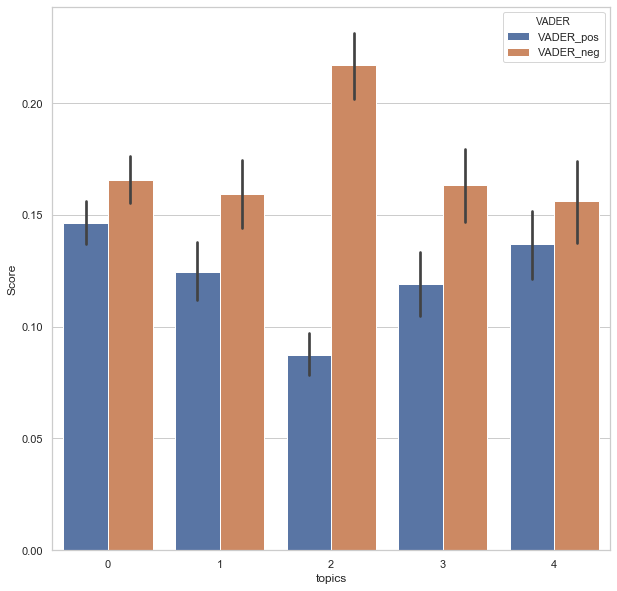

In [510]:
tweets_unique_melted_posneg = tweets_unique_melted[tweets_unique_melted["VADER"]!="VADER_neu"]

plt.figure(figsize = (10,10))
sns.set(style="whitegrid")

sns.barplot(x = 'topics',y = 'Score',hue = 'VADER',data = tweets_unique_melted_posneg)

# Observation: All topics tend to be negative.. 

### 4. Adding in of weights to determine the kind of relationship

a. if got RT, weight is given a value of 2. If it is a Mention, then weight is given a value of 1.

In [759]:
len(tweets_mw_df)

4885

In [760]:
tweets_mw_df.head(30)

,Text,User Account,Retweets,variable,Mentions
0,RT @LividEye: The impact on all the schools is...,tanhuiyi,LividEye,0,LividEye
1,RT @LividEye: The impact on all the schools is...,virginangelic,LividEye,0,LividEye
2,The impact on all the schools is like a tsauna...,LividEye,NaN,0,NaN
3,@PrinceMeedONLY Jgn stress bro. Take your time.,SwagOnDroid,NaN,0,PrinceMeedONLY
4,RT @jmeteo: Nobody at the pool so we got to ho...,tayloryong41,jmeteo,0,jmeteo
5,Kinder Springenden Ball Children Baby Flash Ju...,stevenbold,NaN,0,NaN
6,RT @smitabarooah: @RMantri As it it stress lev...,hindudilse,smitabarooah,0,smitabarooah
7,RT @EurekaMag: Interactive effects of polyamin...,Life_Sciences_,EurekaMag,0,EurekaMag
8,RT @EurekaMag: Interactive effects of polyamin...,Science_Alerts,EurekaMag,0,EurekaMag
9,Interactive effects of polyamines and arbuscul...,EurekaMag,NaN,0,NaN


In [761]:
tweets_mw_df_sent_topic = tweets_mw_df.merge(right = tweets_unique, left_on = 'Text', right_on = 'tweet', how = 'inner')
tweets_mw_df_sent_topic.drop('tweet', axis = 1, inplace = True)
tweets_mw_df_sent_topic

,Text,User Account,Retweets,variable,Mentions,index,noURLnoMention,VADER_pos,VADER_neg,VADER_neu,topics
0,RT @LividEye: The impact on all the schools is...,tanhuiyi,LividEye,0,LividEye,0,RT : The impact on all the schools is like a t...,0.084,0.074,0.842,0
1,RT @LividEye: The impact on all the schools is...,virginangelic,LividEye,0,LividEye,0,RT : The impact on all the schools is like a t...,0.084,0.074,0.842,0
2,The impact on all the schools is like a tsauna...,LividEye,NaN,0,NaN,1,The impact on all the schools is like a tsauna...,0.055,0.110,0.835,0
3,@PrinceMeedONLY Jgn stress bro. Take your time.,SwagOnDroid,NaN,0,PrinceMeedONLY,2,Jgn stress bro. Take your time.,0.000,0.359,0.641,2
4,RT @jmeteo: Nobody at the pool so we got to ho...,tayloryong41,jmeteo,0,jmeteo,3,RT : Nobody at the pool so we got to horse aro...,0.302,0.000,0.698,0
...,...,...,...,...,...,...,...,...,...,...,...
4880,@historyogi @frhn @AudiKhalid I think this one...,tash_aam,NaN,1,frhn,2552,I think this one is fairly measured lah - i...,0.000,0.167,0.833,4
4881,@historyogi @frhn @AudiKhalid I think this one...,tash_aam,NaN,2,AudiKhalid,2552,I think this one is fairly measured lah - i...,0.000,0.167,0.833,4
4882,So I finally bought the @Maybelline Fit Me fou...,ANILxA,NaN,0,Maybelline,2553,So I finally bought the Fit Me foundation ser...,0.218,0.103,0.679,0
4883,So I finally bought the @Maybelline Fit Me fou...,ANILxA,NaN,1,Itcosmetics,2553,So I finally bought the Fit Me foundation ser...,0.218,0.103,0.679,0


In [762]:
tweets_mw_df_sent_topic[tweets_mw_df_sent_topic["User Account"]=='hindudilse']

,Text,User Account,Retweets,variable,Mentions,index,noURLnoMention,VADER_pos,VADER_neg,VADER_neu,topics
6,RT @smitabarooah: @RMantri As it it stress lev...,hindudilse,smitabarooah,0,smitabarooah,5,RT : As it it stress levels high hain. Kyon m...,0.0,0.189,0.811,2
8,RT @smitabarooah: @RMantri As it it stress lev...,hindudilse,smitabarooah,1,RMantri,5,RT : As it it stress levels high hain. Kyon m...,0.0,0.189,0.811,2


In [763]:
tweets_mw_df[tweets_mw_df["User Account"]=="hindudilse"]

,Text,User Account,Retweets,variable,Mentions
6,RT @smitabarooah: @RMantri As it it stress lev...,hindudilse,smitabarooah,0,smitabarooah
4058,RT @smitabarooah: @RMantri As it it stress lev...,hindudilse,smitabarooah,1,RMantri


In [86]:
outcome = tweets_mw_df.copy()

In [517]:
outcome_clean = outcome.drop('variable', axis = 1)
outcome_clean


,Text,User Account,Retweets,Mentions
0,RT @LividEye: The impact on all the schools is...,tanhuiyi,LividEye,LividEye
1,RT @LividEye: The impact on all the schools is...,virginangelic,LividEye,LividEye
2,The impact on all the schools is like a tsauna...,LividEye,NaN,NaN
3,@PrinceMeedONLY Jgn stress bro. Take your time.,SwagOnDroid,NaN,PrinceMeedONLY
4,RT @jmeteo: Nobody at the pool so we got to ho...,tayloryong41,jmeteo,jmeteo
...,...,...,...,...
4880,@willsworldview @JohnKrahn2 @BrianSlimdog77 @B...,whnlaws,NaN,Thagraysentinel
4881,@willsworldview @JohnKrahn2 @BrianSlimdog77 @B...,whnlaws,NaN,Enigmaticatious
4882,@willsworldview @JohnKrahn2 @BrianSlimdog77 @B...,whnlaws,NaN,rmbctious
4883,@willsworldview @JohnKrahn2 @BrianSlimdog77 @B...,whnlaws,NaN,__Helicon__


In [520]:
outcome_clean[outcome_clean["Retweets"].isna()]

,Text,User Account,Retweets,Mentions
2,The impact on all the schools is like a tsauna...,LividEye,NaN,NaN
3,@PrinceMeedONLY Jgn stress bro. Take your time.,SwagOnDroid,NaN,PrinceMeedONLY
5,Kinder Springenden Ball Children Baby Flash Ju...,stevenbold,NaN,NaN
9,Interactive effects of polyamines and arbuscul...,EurekaMag,NaN,NaN
10,"Stress can drag your whole team down, especial...",LewisGarrad,NaN,voiceongrowth
...,...,...,...,...
4880,@willsworldview @JohnKrahn2 @BrianSlimdog77 @B...,whnlaws,NaN,Thagraysentinel
4881,@willsworldview @JohnKrahn2 @BrianSlimdog77 @B...,whnlaws,NaN,Enigmaticatious
4882,@willsworldview @JohnKrahn2 @BrianSlimdog77 @B...,whnlaws,NaN,rmbctious
4883,@willsworldview @JohnKrahn2 @BrianSlimdog77 @B...,whnlaws,NaN,__Helicon__


In [521]:
outcome_clean['weight'] = ''

for row in range(0,len(outcome_clean)):
    outcome_clean.iloc[row, -1] = 2 - sum(outcome_clean.iloc[row,2:4].isna())


In [522]:
outcome_clean

,Text,User Account,Retweets,Mentions,weight
0,RT @LividEye: The impact on all the schools is...,tanhuiyi,LividEye,LividEye,2
1,RT @LividEye: The impact on all the schools is...,virginangelic,LividEye,LividEye,2
2,The impact on all the schools is like a tsauna...,LividEye,NaN,NaN,0
3,@PrinceMeedONLY Jgn stress bro. Take your time.,SwagOnDroid,NaN,PrinceMeedONLY,1
4,RT @jmeteo: Nobody at the pool so we got to ho...,tayloryong41,jmeteo,jmeteo,2
...,...,...,...,...,...
4880,@willsworldview @JohnKrahn2 @BrianSlimdog77 @B...,whnlaws,NaN,Thagraysentinel,1
4881,@willsworldview @JohnKrahn2 @BrianSlimdog77 @B...,whnlaws,NaN,Enigmaticatious,1
4882,@willsworldview @JohnKrahn2 @BrianSlimdog77 @B...,whnlaws,NaN,rmbctious,1
4883,@willsworldview @JohnKrahn2 @BrianSlimdog77 @B...,whnlaws,NaN,__Helicon__,1


### 5. Network Analysis

In [14]:
import networkx as nx

In [523]:
# Node Creation
node_creation1 = outcome_clean["User Account"].drop_duplicates(keep = 'first')
node_creation2 = outcome_clean["Mentions"].drop_duplicates(keep = 'first')

node_creation_list = [node_creation1, node_creation2]
node_creation = pd.concat(node_creation_list)

# Observation: This is no longer relevant anymore because you can create a network based on the "add_from_edges" method

In [750]:
# using the above variable 'outcome_clean', we'll generate a list for the creation.

outcome_clean_edge_creation = outcome_clean.loc[:,["User Account","Mentions","weight"]]
outcome_clean_edge_creation_groupby = outcome_clean_edge_creation.groupby(["User Account","Mentions"]).sum()

outcome_clean_edge_creation_groupby.reset_index(inplace = True)


edge_creation = []

for row in range(0,len(outcome_clean_edge_creation_groupby)):
    edge_creation.append([outcome_clean_edge_creation_groupby.iloc[row,0], outcome_clean_edge_creation_groupby.iloc[row,1], {"weight":outcome_clean_edge_creation_groupby.iloc[row,2]}])

edge_creation

[['02a9f413a5e3409', 'RiThViK_17', {'weight': 2}],
 ['02a9f413a5e3409', 'Sruti55713878', {'weight': 2}],
 ['02a9f413a5e3409', 'ivibhatweedy', {'weight': 2}],
 ['0athmeal', 'estherabigaaail', {'weight': 1}],
 ['0lhigen', 'NabaNaseer', {'weight': 2}],
 ['10minus6cosm', 'EngEongOoi', {'weight': 2}],
 ['18armyluv', 'bugkkura', {'weight': 2}],
 ['1lleg1irl', 'ErinBrownWrites', {'weight': 2}],
 ['1zombywoof', 'aaxxcdd', {'weight': 2}],
 ['24x7Page', '24x7Page', {'weight': 2}],
 ['28_HarshaSingh', 'MorningContext', {'weight': 2}],
 ['2covet', 'JoTyndallNZ', {'weight': 2}],
 ['30sakthi45', 'NathiyaFaith', {'weight': 2}],
 ['349262_', 'RUSYAIDI_RASHID', {'weight': 2}],
 ['3_stigma', 'tinyjiyang', {'weight': 2}],
 ['44FFFF2', 'awarenews', {'weight': 2}],
 ['44PatihJantung', 'valix217', {'weight': 1}],
 ['483caaec21b44b2', 'smitabarooah', {'weight': 2}],
 ['4tot_', 'faatinxo', {'weight': 2}],
 ['61taeng', 'itsakyo', {'weight': 2}],
 ['6uttercuppp', 'Jaarfuckingvis', {'weight': 2}],
 ['726Yasid', 

In [721]:
# Creating of network Diagram

G = nx.DiGraph()
G.add_edges_from(edge_creation)
eigen_values = nx.eigenvector_centrality(G)
nx.set_node_attributes(G,eigen_values, "eigenValues")

indegree_values = nx.in_degree_centrality(G)
nx.set_node_attributes(G, indegree_values, "indegreeValues")

degree_values = dict([x for x in G.degree()])
nx.set_node_attributes(G, degree_values, "degreeValues")

/Users/bobbycxy/opt/anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):
/Users/bobbycxy/opt/anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:676: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if cb.iterable(node_size):  # many node sizes


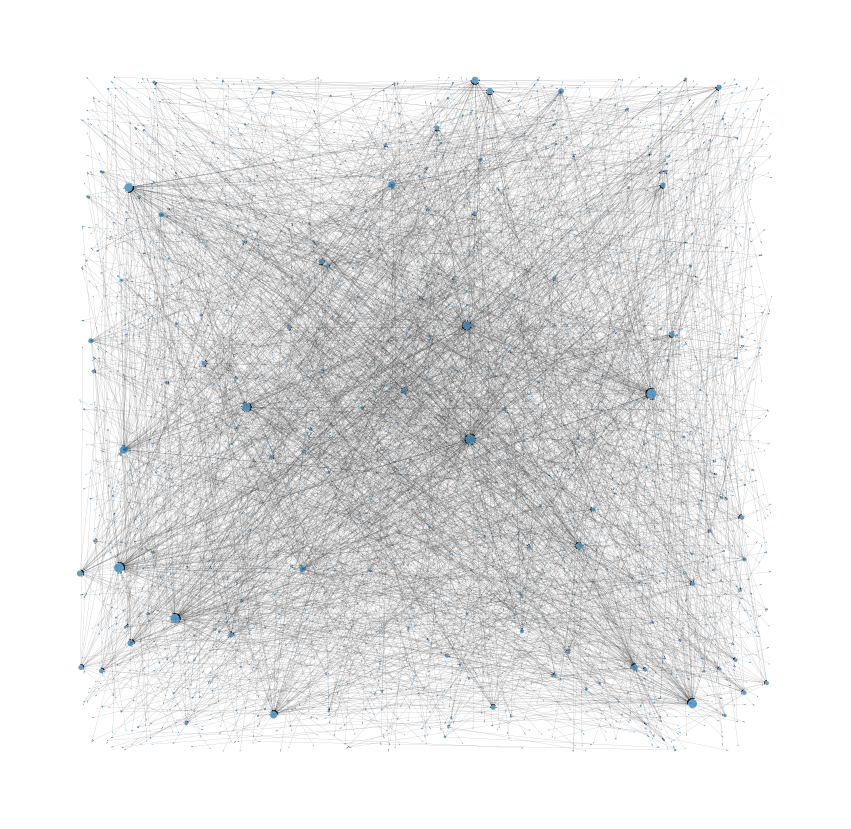

In [575]:
# Generating a Network Diagram of the tweets from our findings

# Create random layout positions
pos = nx.random_layout(G)

# Figure Size
plt.figure(figsize = (15,15))

# Create size list
sizes = [x[1] for x in G.degree()]

# Draw the network
nx.draw_networkx(G, pos, 
    with_labels = False, 
    node_size = sizes,
    width = 0.1, alpha = 0.7,
    arrowsize = 2, linewidths = 0)

# Turn axis off and show
plt.axis('off'); plt.show()

In [577]:
centrality = nx.in_degree_centrality(G)
column_names = ['screen_name', 'degree_centrality']

# Store centralities in DataFrame
rt = pd.DataFrame(list(centrality.items()), columns = column_names)

# Print first five results in descending order of centrality
print(rt.sort_values('degree_centrality', ascending = False).head())


      screen_name  degree_centrality
107  MustaqimJiwa           0.026243
94     mizi_wahid           0.024586
32   smitabarooah           0.022928
92       _ayakojh           0.022099
36        itsakyo           0.021823


In [578]:
centrality = nx.betweenness_centrality(G)
column_names = ['screen_name', 'betweenness_centrality']

# Store centralities in DataFrame
rt = pd.DataFrame(list(centrality.items()), columns = column_names)

# Print first five results in descending order of centrality
print(rt.sort_values('betweenness_centrality', ascending = False).head())

         screen_name  betweenness_centrality
51          AChVoice                0.000023
400      Daraljoshua                0.000016
197      Defence_360                0.000011
99            bxbxg_                0.000010
81   SoftPowerCenter                0.000010


In [753]:
from networkx.algorithms import community

comp = community.girvan_newman(G)
communities_list = list(sorted(c) for c in next(comp))

In [755]:
# deriving the communities with a size of at least 20

k = 20
top_communities = []

for i in range(0,len(communities_list)):
    if len(communities_list[i]) >= k:
        top_communities.append(communities_list[i])

        

In [756]:
len(top_communities)

24

In [757]:
# Creating a dictionary to add community ID's to network, G

top_communities_nodes_communityID = {}
i = 0

for community in top_communities:
    for node in community:
        top_communities_nodes_communityID.update({node : i})
    i += 1
    
top_communities_nodes_communityID

{'0lhigen': 0,
 'AmnaAliShareef': 0,
 'Applecinnamonmv': 0,
 'Auralitica': 0,
 'FathimathHusha': 0,
 'Ishan_Inz': 0,
 'MaaniAnwar': 0,
 'Marcus15510974': 0,
 'MarinaFaiz': 0,
 'NabaNaseer': 0,
 'Nafee77': 0,
 'NashimMirash': 0,
 'NihaNaseer': 0,
 'Omulungi_Hawt': 0,
 'SamiyyaAR': 0,
 'SaraShafeyu': 0,
 '_CYchology': 0,
 '_maail10': 0,
 'alilayaal': 0,
 'amynaa': 0,
 'angelaalegre_': 0,
 'benchy007': 0,
 'haaboli': 0,
 'hamnahaqansari': 0,
 'hathareskan': 0,
 'hayashiham': 0,
 'ipha_ahmed': 0,
 'ish_aa': 0,
 'izznzz': 0,
 'jeeehan': 0,
 'kofeemeta': 0,
 'maseeh_n5m': 0,
 'mifkko': 0,
 'mindtrip88': 0,
 'muhammed_uday': 0,
 'nafhha': 0,
 'naphbutt': 0,
 'nayyyifa': 0,
 'neiymeeheh': 0,
 'reemadamibrahim': 0,
 'rfdhbrhm': 0,
 'rikachs': 0,
 'shafmed': 0,
 'sharasekaram': 0,
 'shininay131825': 0,
 'sumudhuj': 0,
 'yajatdua': 0,
 'zarascomics': 0,
 '18armyluv': 1,
 '61taeng': 1,
 'AtikasariFina': 1,
 'CevarAlexander': 1,
 'Dlrshnnon': 1,
 'Dragnee68123115': 1,
 'IndayFaith02': 1,
 'IzabelGr

In [745]:
# Adding to network, G, our community IDs of those identified to be in communities of size 20 and above

nx.set_node_attributes(G,top_communities_nodes_communityID, "communityID")


In [741]:
# confirms that there are no duplicate nodes in our top communities

sum(pd.DataFrame(top_communities_nodes).duplicated())

0

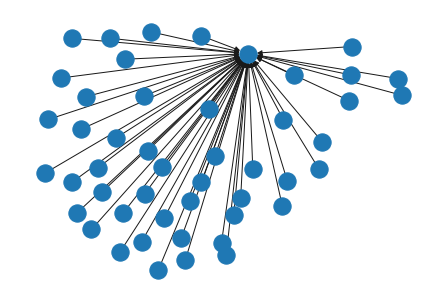

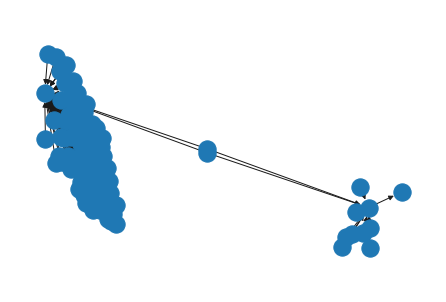

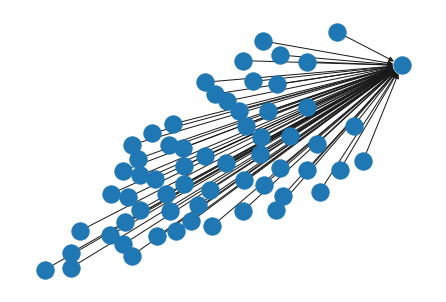

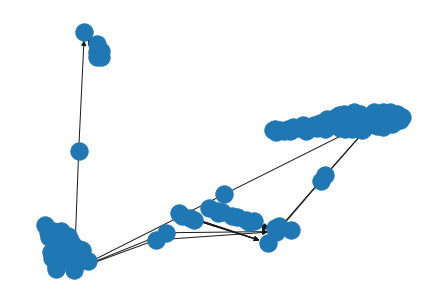

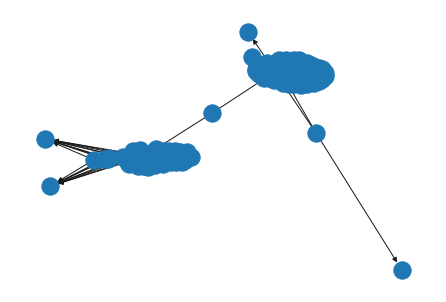

...

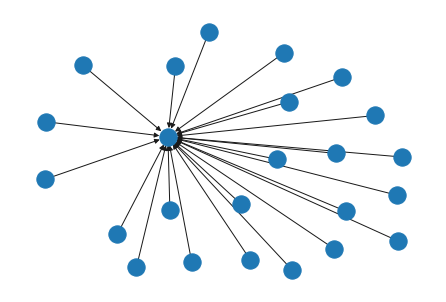

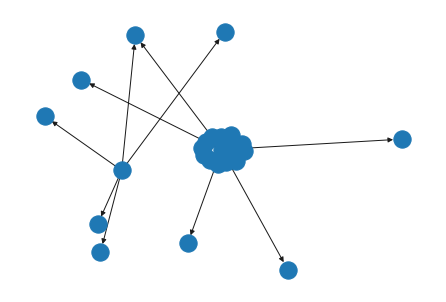

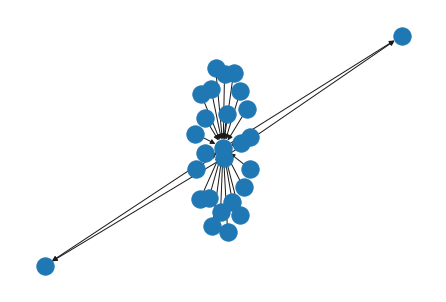

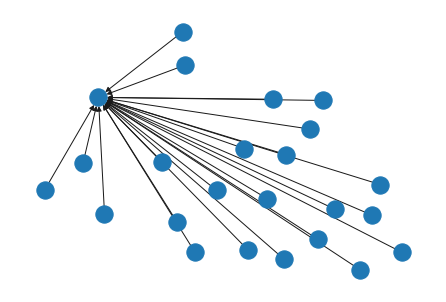

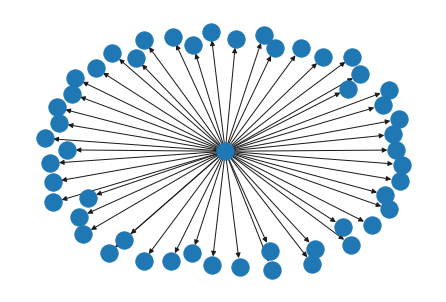

In [676]:
for i in range(0,len(top_communities)):
    G_sg = G.subgraph(top_communities[i])
    nx.draw(G_sg)
    plt.show()

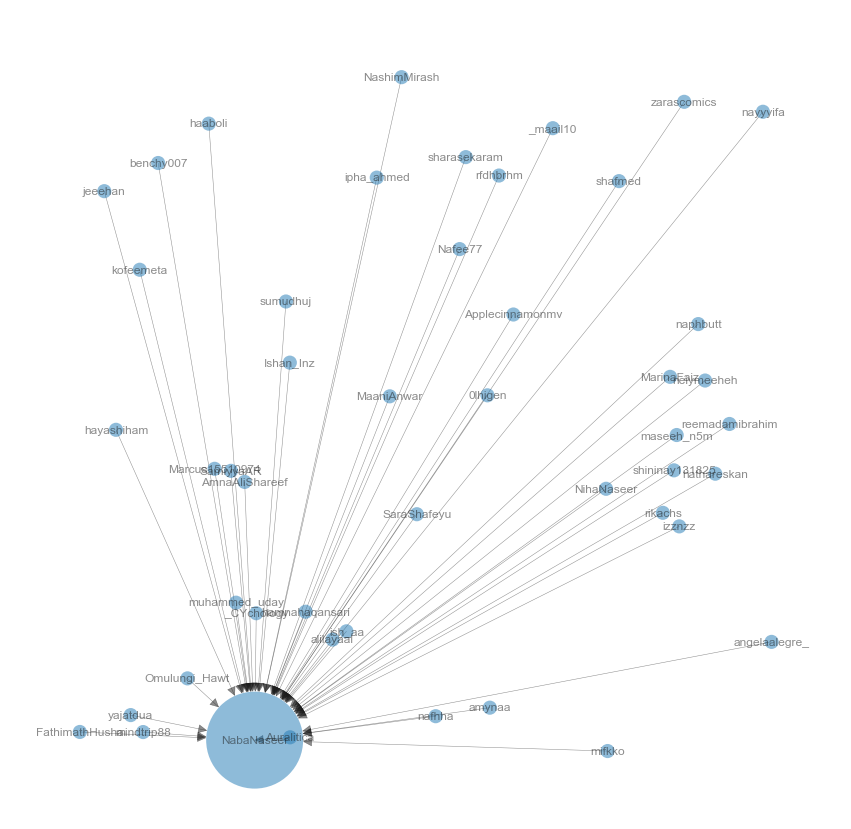

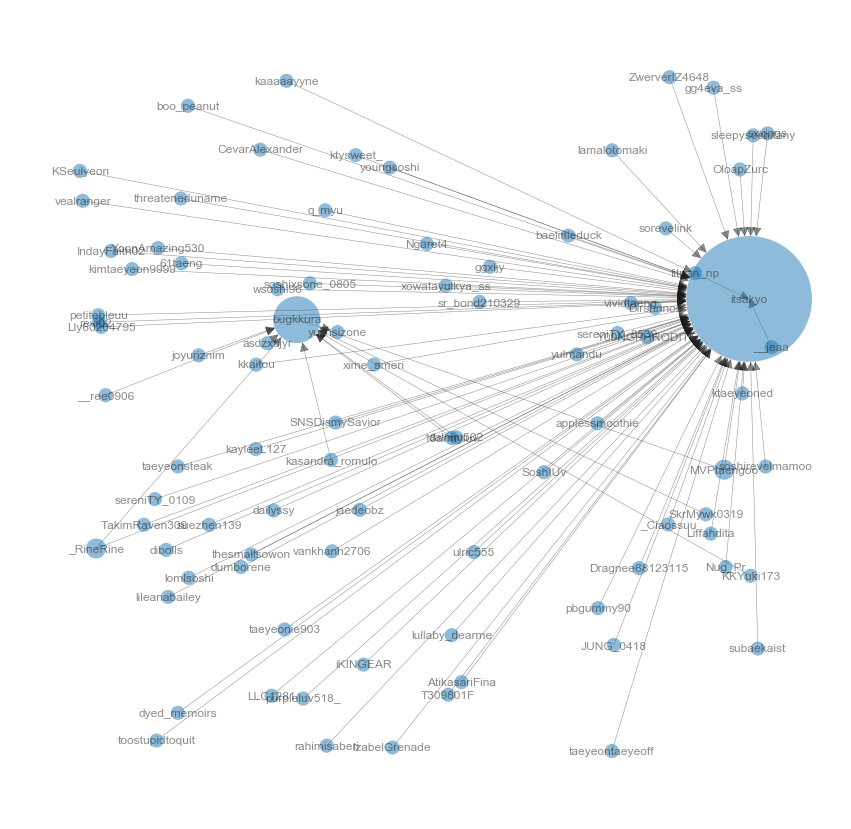

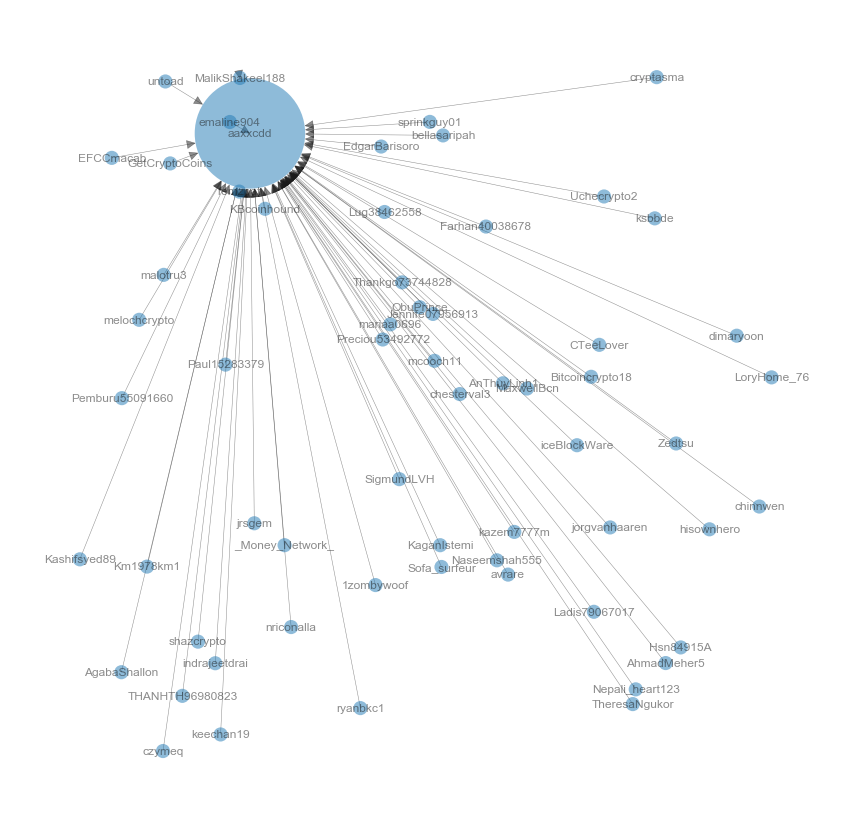

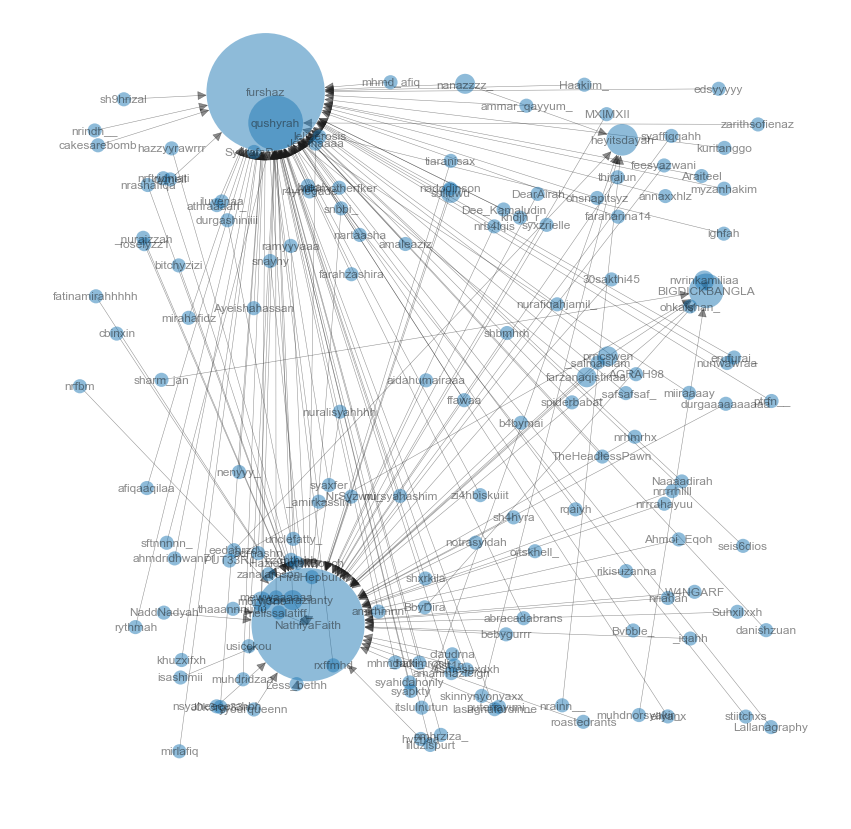

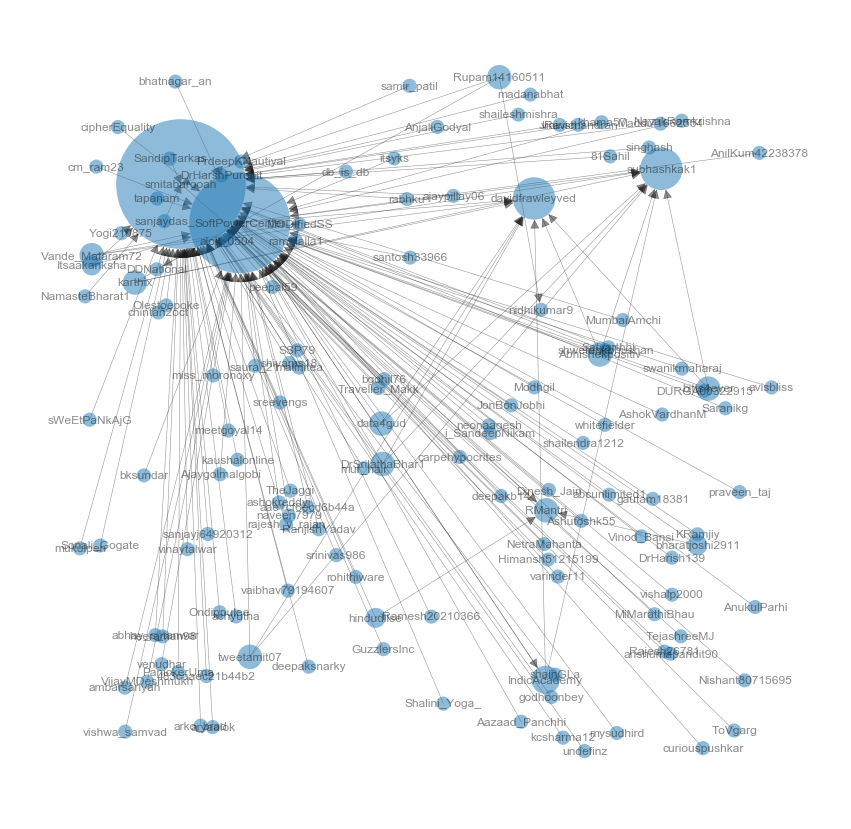

...

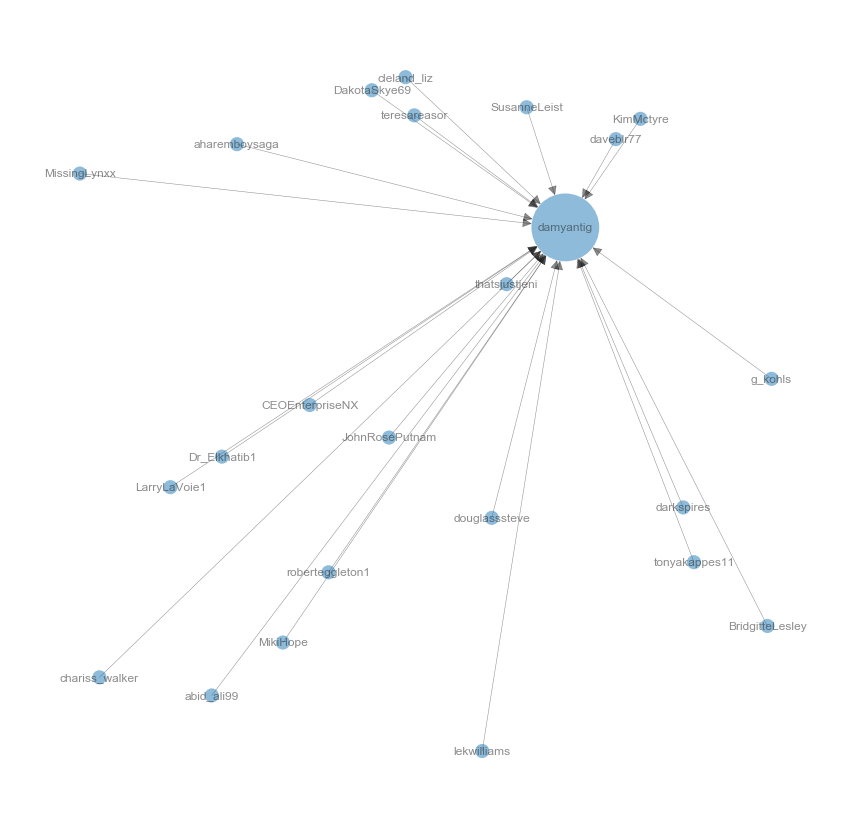

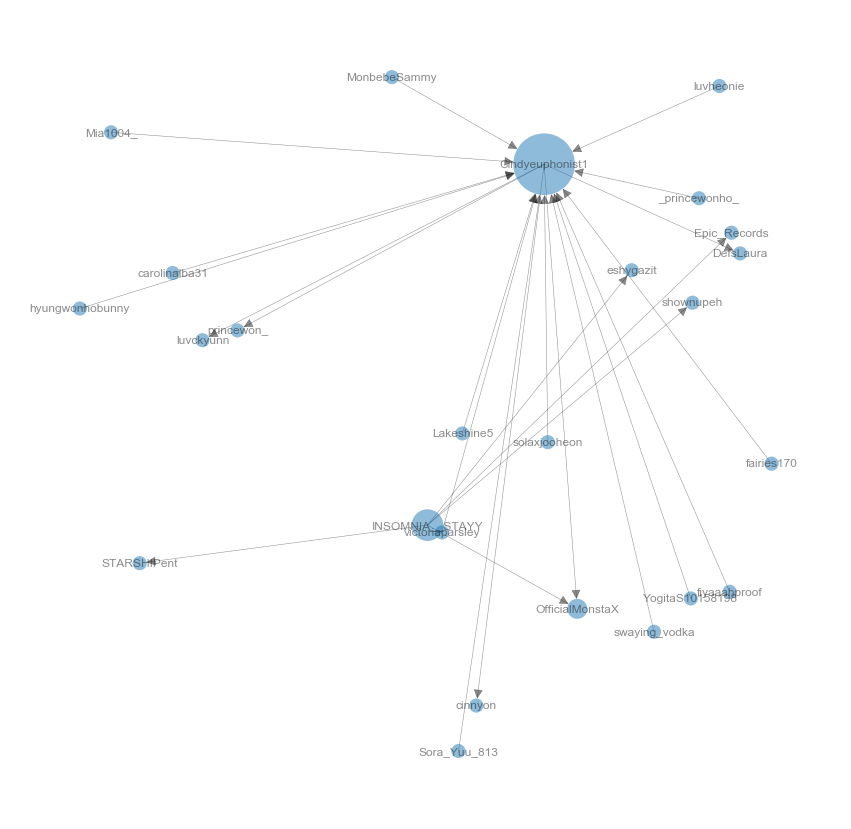

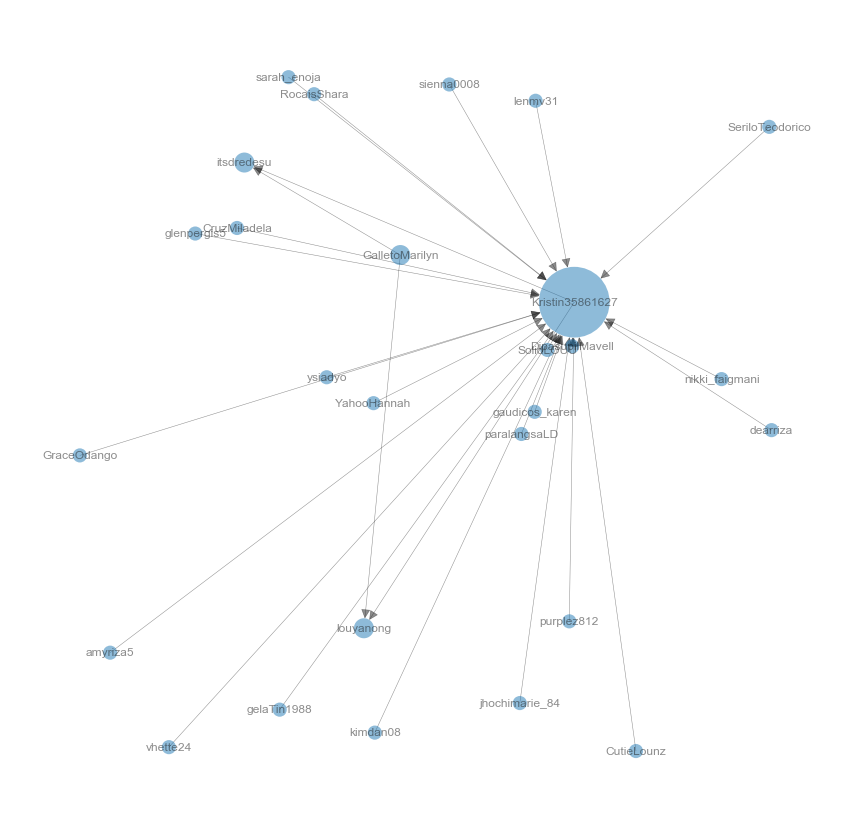

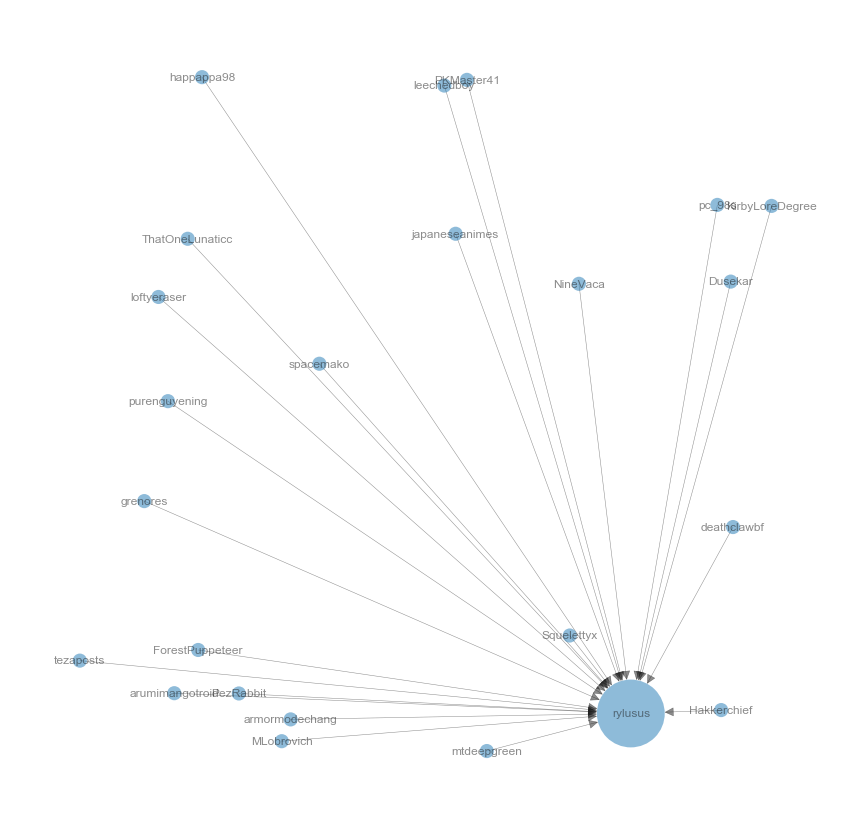

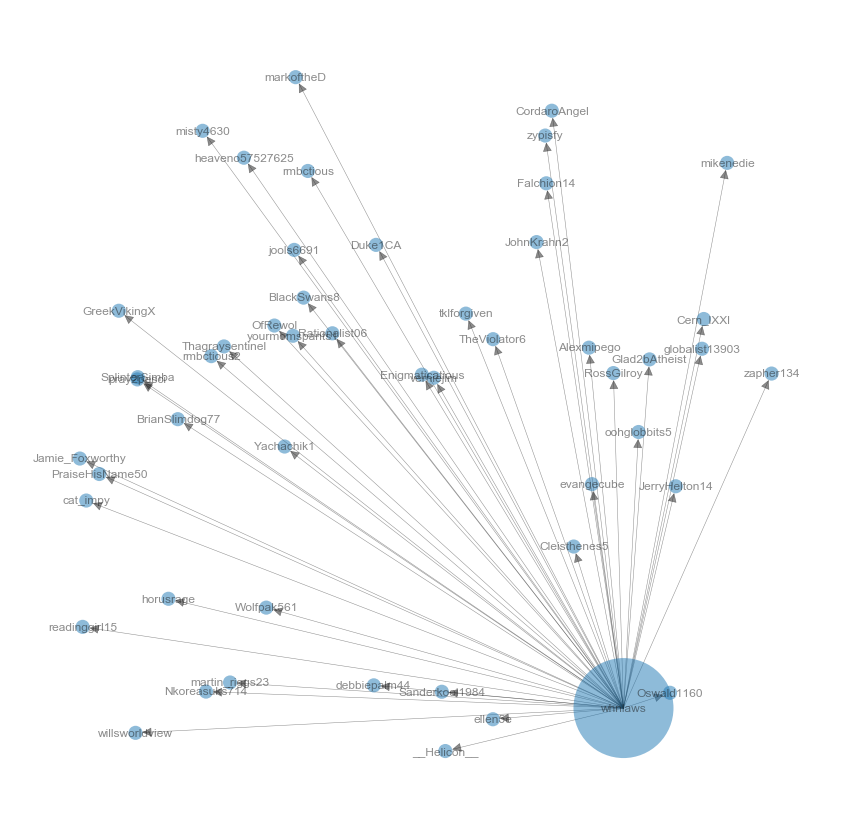

In [726]:
for i in range(0,len(top_communities)):
    G_sg = G.subgraph(top_communities[i])
    
    # Create random layout positions
    pos = nx.random_layout(G_sg)

    # Figure Size
    plt.figure(figsize = (15,15))

    # Create size list
    sizes = [(v['degreeValues'] * 200) for (u, v) in G_sg.nodes(data=True)]
    # sizes = [x[1]*20 for x in G_sg.degree()]

    # Draw the network
    nx.draw_networkx(G_sg, pos, 
        with_labels = True, 
        node_size = sizes,
        width = 0.5, alpha = 0.5,
        arrowsize = 20, linewidths = 0)
    
    # Draw the axis based on their weights
    

    # Turn axis off and show
    plt.axis('off'); plt.show()

### Pulling out the communities

In [764]:
tweets_mw_df_sent_topic

,Text,User Account,Retweets,variable,Mentions,index,noURLnoMention,VADER_pos,VADER_neg,VADER_neu,topics
0,RT @LividEye: The impact on all the schools is...,tanhuiyi,LividEye,0,LividEye,0,RT : The impact on all the schools is like a t...,0.084,0.074,0.842,0
1,RT @LividEye: The impact on all the schools is...,virginangelic,LividEye,0,LividEye,0,RT : The impact on all the schools is like a t...,0.084,0.074,0.842,0
2,The impact on all the schools is like a tsauna...,LividEye,NaN,0,NaN,1,The impact on all the schools is like a tsauna...,0.055,0.110,0.835,0
3,@PrinceMeedONLY Jgn stress bro. Take your time.,SwagOnDroid,NaN,0,PrinceMeedONLY,2,Jgn stress bro. Take your time.,0.000,0.359,0.641,2
4,RT @jmeteo: Nobody at the pool so we got to ho...,tayloryong41,jmeteo,0,jmeteo,3,RT : Nobody at the pool so we got to horse aro...,0.302,0.000,0.698,0
...,...,...,...,...,...,...,...,...,...,...,...
4880,@historyogi @frhn @AudiKhalid I think this one...,tash_aam,NaN,1,frhn,2552,I think this one is fairly measured lah - i...,0.000,0.167,0.833,4
4881,@historyogi @frhn @AudiKhalid I think this one...,tash_aam,NaN,2,AudiKhalid,2552,I think this one is fairly measured lah - i...,0.000,0.167,0.833,4
4882,So I finally bought the @Maybelline Fit Me fou...,ANILxA,NaN,0,Maybelline,2553,So I finally bought the Fit Me foundation ser...,0.218,0.103,0.679,0
4883,So I finally bought the @Maybelline Fit Me fou...,ANILxA,NaN,1,Itcosmetics,2553,So I finally bought the Fit Me foundation ser...,0.218,0.103,0.679,0


In [771]:
len(top_communities_nodes_communityID)

1548

In [772]:
top_communities_nodes_communityID_df = pd.DataFrame(top_communities_nodes_communityID.items(), columns = ['User Account','CommunityID'])

In [777]:
top_communities_nodes_communityID_df

,User Account,CommunityID
0,0lhigen,0
1,AmnaAliShareef,0
2,Applecinnamonmv,0
3,Auralitica,0
4,FathimathHusha,0
...,...,...
1543,whnlaws,23
1544,willsworldview,23
1545,yourmomspants1,23
1546,zapher134,23


In [780]:
tweets_mw_df_sent_topic[tweets_mw_df_sent_topic['Mentions'] == 'zypisfy']

,Text,User Account,Retweets,variable,Mentions,index,noURLnoMention,VADER_pos,VADER_neg,VADER_neu,topics
4743,@willsworldview @JohnKrahn2 @BrianSlimdog77 @B...,whnlaws,NaN,20,zypisfy,2534,...,0.087,0.196,0.717,3


In [786]:
tweets_mw_df_sent_topic_communityID = tweets_mw_df_sent_topic.merge(right = top_communities_nodes_communityID_df, left_on = 'User Account', right_on = 'User Account', how = 'left')
tweets_mw_df_sent_topic_communityID

,Text,User Account,Retweets,variable,Mentions,index,noURLnoMention,VADER_pos,VADER_neg,VADER_neu,topics,CommunityID
0,RT @LividEye: The impact on all the schools is...,tanhuiyi,LividEye,0,LividEye,0,RT : The impact on all the schools is like a t...,0.084,0.074,0.842,0,18.0
1,RT @LividEye: The impact on all the schools is...,virginangelic,LividEye,0,LividEye,0,RT : The impact on all the schools is like a t...,0.084,0.074,0.842,0,18.0
2,The impact on all the schools is like a tsauna...,LividEye,NaN,0,NaN,1,The impact on all the schools is like a tsauna...,0.055,0.110,0.835,0,18.0
3,@PrinceMeedONLY Jgn stress bro. Take your time.,SwagOnDroid,NaN,0,PrinceMeedONLY,2,Jgn stress bro. Take your time.,0.000,0.359,0.641,2,NaN
4,RT @jmeteo: Nobody at the pool so we got to ho...,tayloryong41,jmeteo,0,jmeteo,3,RT : Nobody at the pool so we got to horse aro...,0.302,0.000,0.698,0,6.0
...,...,...,...,...,...,...,...,...,...,...,...,...
4880,@historyogi @frhn @AudiKhalid I think this one...,tash_aam,NaN,1,frhn,2552,I think this one is fairly measured lah - i...,0.000,0.167,0.833,4,18.0
4881,@historyogi @frhn @AudiKhalid I think this one...,tash_aam,NaN,2,AudiKhalid,2552,I think this one is fairly measured lah - i...,0.000,0.167,0.833,4,18.0
4882,So I finally bought the @Maybelline Fit Me fou...,ANILxA,NaN,0,Maybelline,2553,So I finally bought the Fit Me foundation ser...,0.218,0.103,0.679,0,NaN
4883,So I finally bought the @Maybelline Fit Me fou...,ANILxA,NaN,1,Itcosmetics,2553,So I finally bought the Fit Me foundation ser...,0.218,0.103,0.679,0,NaN


In [784]:
tweets_mw_df_sent_topic_communityID['CommunityID'].value_counts()

17.0    213
5.0     176
3.0     166
6.0     164
4.0     161
11.0    100
1.0      91
9.0      89
18.0     87
8.0      81
16.0     64
2.0      61
23.0     50
0.0      49
7.0      46
12.0     34
13.0     33
21.0     30
20.0     29
15.0     27
19.0     23
14.0     23
22.0     23
10.0     20
Name: CommunityID, dtype: int64

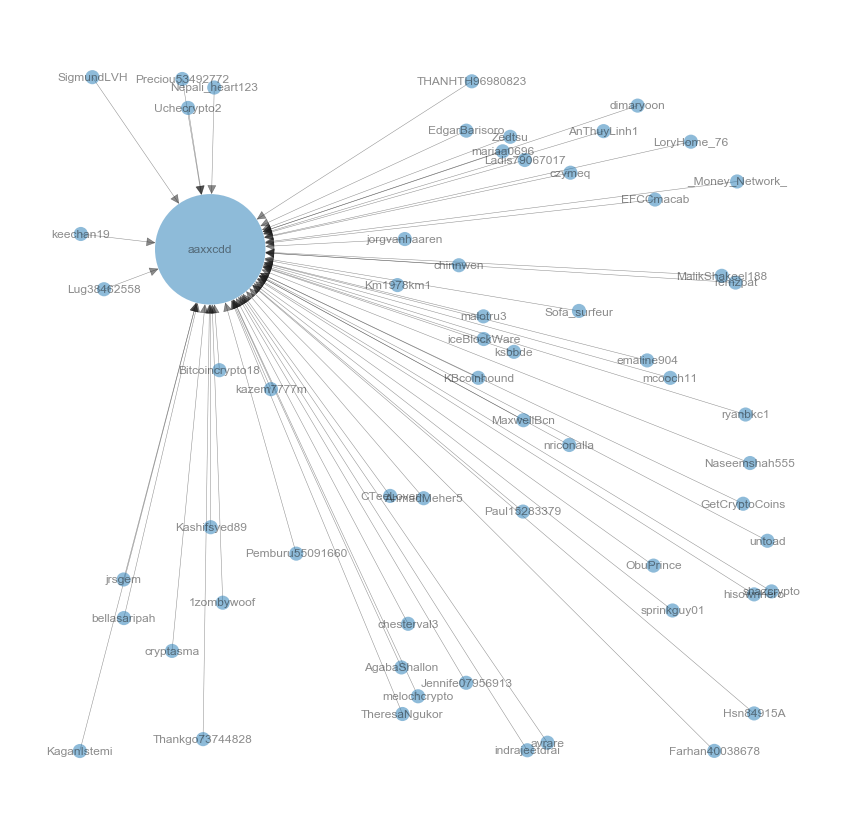

In [797]:
G_sg = G.subgraph(top_communities[2])
    
# Create random layout positions
pos = nx.random_layout(G_sg)

# Figure Size
plt.figure(figsize = (15,15))

# Create size list
sizes = [(v['degreeValues'] * 200) for (u, v) in G_sg.nodes(data=True)]
# sizes = [x[1]*20 for x in G_sg.degree()]

# Draw the network
nx.draw_networkx(G_sg, pos, 
    with_labels = True, 
    node_size = sizes,
    width = 0.5, alpha = 0.5,
    arrowsize = 20, linewidths = 0)

# Draw the axis based on their weights


# Turn axis off and show
plt.axis('off'); plt.show()

In [848]:
test_groupby = tweets_mw_df_sent_topic_communityID.groupby(['CommunityID']).mean()

pos_communities_list = list(test_groupby[test_groupby["VADER_pos"] > test_groupby["VADER_neg"]].index)
pos_communities_list

[0.0, 1.0, 2.0, 3.0, 5.0, 6.0, 7.0, 14.0, 17.0, 20.0]

In [869]:
pos_communities_list.remove(2.0)

In [870]:
pos_communities_list

[0.0, 1.0, 3.0, 5.0, 6.0, 7.0, 14.0, 17.0, 20.0]

CommunityID:  0
0: 0.112*"find" + 0.112*"type" + 0.112*"t…" + 0.112*"lot" + 0.112*"ableist" + 0.112*"right" + 0.112*"exactly" + 0.112*"rhetoric" + 0.013*"take" + 0.013*"distract"
1: 0.147*"take" + 0.088*"mental" + 0.088*"health" + 0.088*"socialdistancing" + 0.088*"care" + 0.088*"break" + 0.088*"sure" + 0.088*"distract" + 0.030*"rhetoric" + 0.030*"exactly"


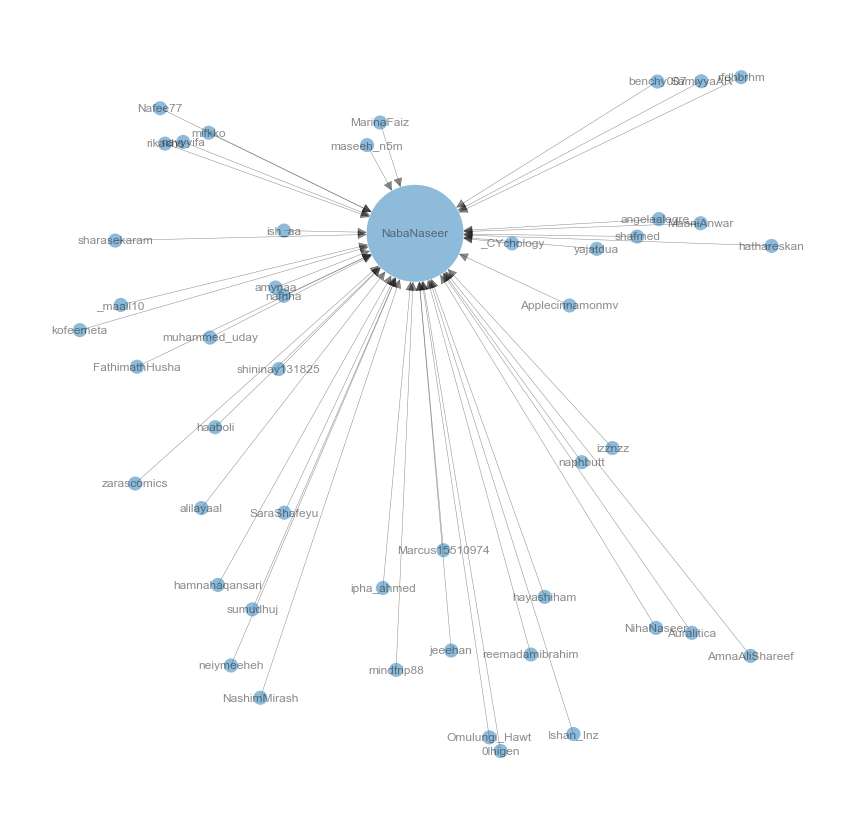

CommunityID:  1
0: 0.123*"fucking" + 0.113*"want" + 0.113*"happening" + 0.113*"dont" + 0.113*"life" + 0.103*"only…" + 0.015*"useless" + 0.015*"feel" + 0.015*"thing" + 0.015*"good"
1: 0.051*"ago" + 0.051*"taeyeon" + 0.051*"hence" + 0.051*"spin" + 0.051*"made" + 0.051*"fan" + 0.051*"tonight" + 0.051*"instead" + 0.051*"skill" + 0.051*"since"


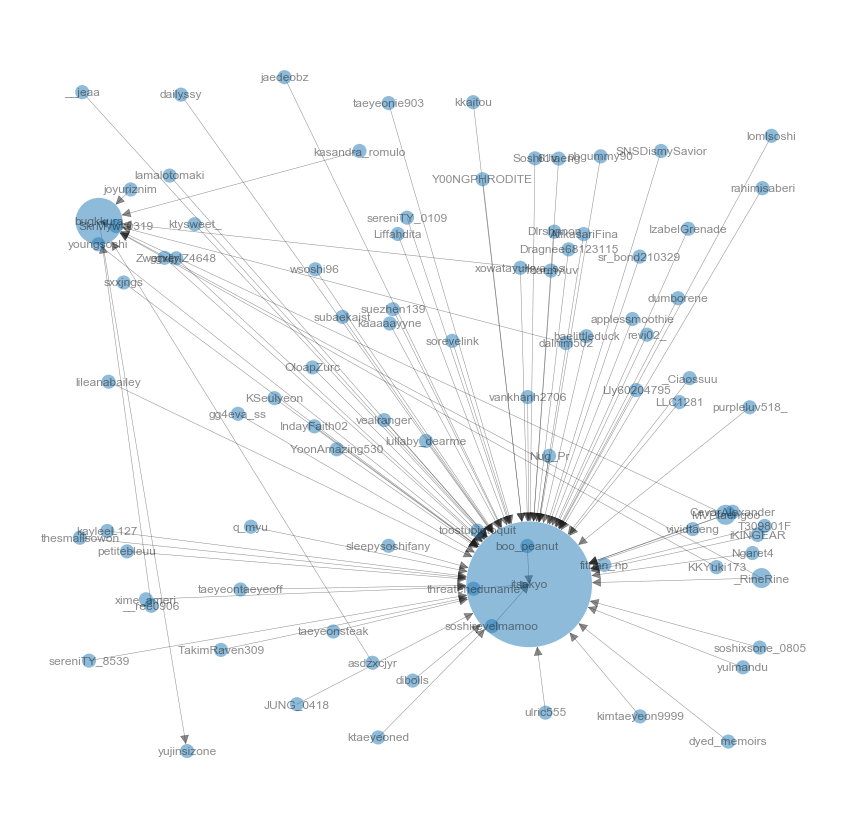

CommunityID:  3
0: 0.093*"look" + 0.093*"even" + 0.093*"u" + 0.093*"lol" + 0.093*"pretty" + 0.093*"struggle" + 0.032*"tired" + 0.031*"sick" + 0.022*"putting" + 0.022*"straight"
1: 0.055*"suka" + 0.055*"build" + 0.055*"senang" + 0.055*"islam" + 0.055*"wedding" + 0.055*"unne…" + 0.055*"stigma" + 0.055*"ikut" + 0.055*"part" + 0.055*"big"


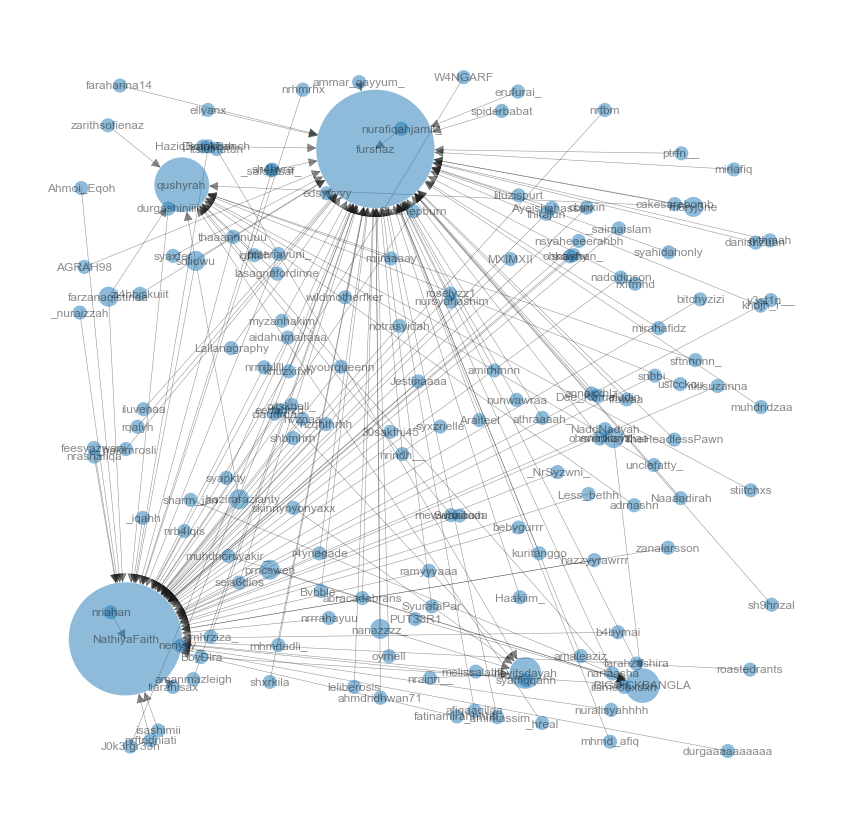

CommunityID:  5
0: 0.054*"anyone" + 0.037*"never" + 0.037*"true" + 0.037*"lie" + 0.037*"depressed" + 0.036*"fun" + 0.036*"bored" + 0.036*"till" + 0.031*"personal" + 0.031*"nobody"
1: 0.121*"love" + 0.066*"always" + 0.064*"keep" + 0.062*"wan" + 0.060*"mental" + 0.060*"ta" + 0.060*"illness" + 0.034*"lookout" + 0.033*"everything" + 0.033*"please"


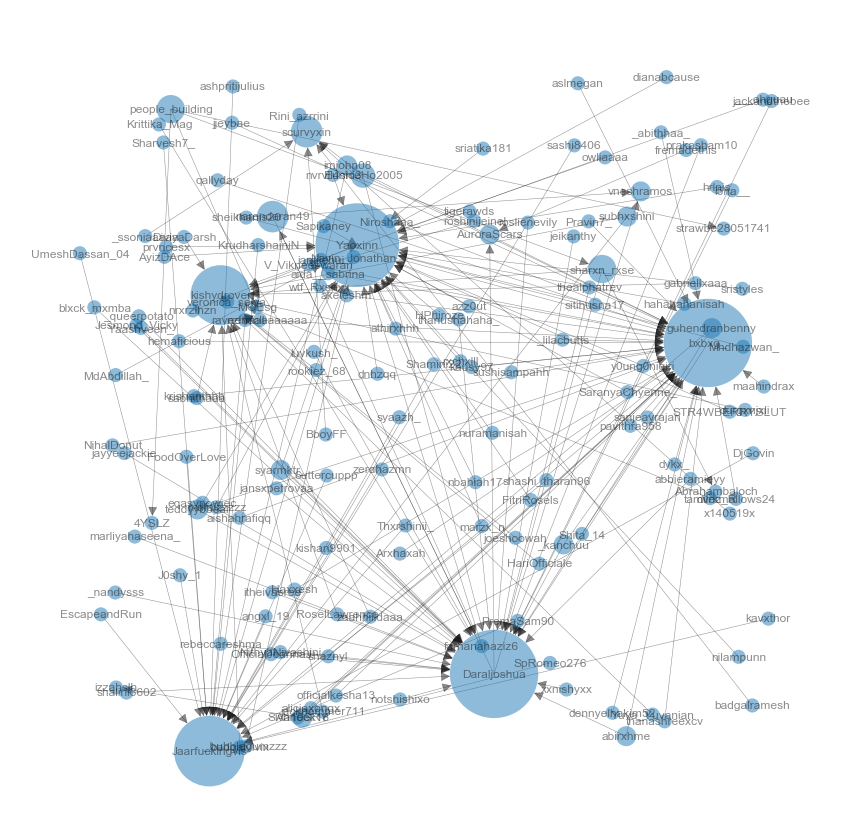

CommunityID:  6
0: 0.039*"school" + 0.035*"student" + 0.033*"bullying" + 0.033*"toh" + 0.033*"incident" + 0.033*"mee" + 0.031*"principal" + 0.029*"disciplined" + 0.029*"differentiates" + 0.029*"covid-19"
1: 0.047*"10" + 0.043*"coronavirus" + 0.033*"die" + 0.030*"uk" + 0.020*"year" + 0.019*"taunted" + 0.019*"schoolmate" + 0.019*"'ugly" + 0.019*"'fat" + 0.019*"—"


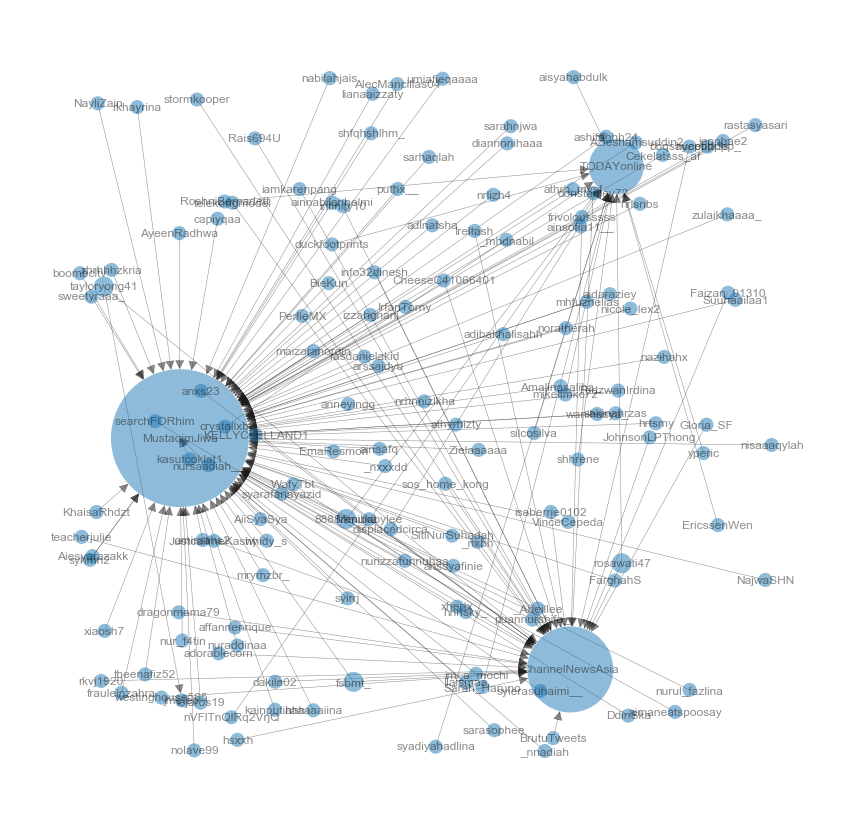

CommunityID:  7
0: 0.032*"maybe" + 0.032*"daily" + 0.026*"know" + 0.026*"body" + 0.026*"tired" + 0.026*"depressed" + 0.026*"sad" + 0.026*"fighting" + 0.026*"exhausted" + 0.017*"constantly"
1: 0.039*"and…" + 0.036*"selfcare" + 0.034*"picture" + 0.034*"le" + 0.034*"magazine" + 0.034*"energy" + 0.034*"becomes" + 0.034*"painted" + 0.034*"limited" + 0.034*"glamorous"


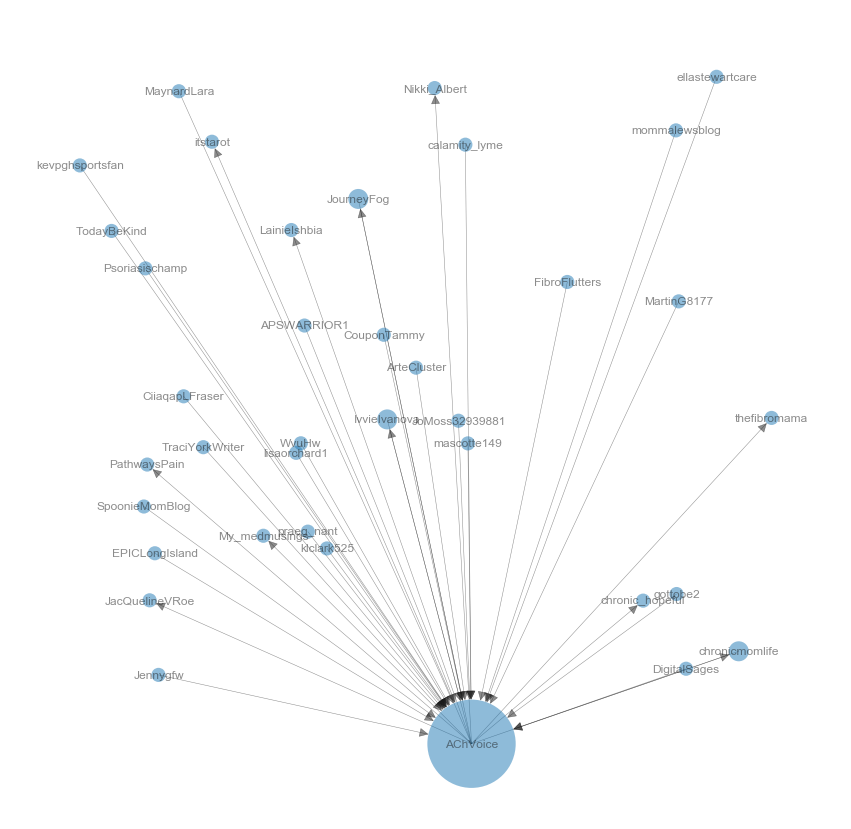

CommunityID:  14
0: 0.067*"beijing" + 0.067*"everyone" + 0.067*"hope" + 0.067*"protection" + 0.067*"take" + 0.067*"stay" + 0.067*"safe" + 0.067*"home" + 0.067*"personal" + 0.067*"continue"
1: 0.067*"self-quarantined" + 0.067*"care" + 0.067*"good" + 0.067*"healthy" + 0.067*"currently" + 0.067*"continue" + 0.067*"personal" + 0.067*"home" + 0.067*"safe" + 0.067*"stay"


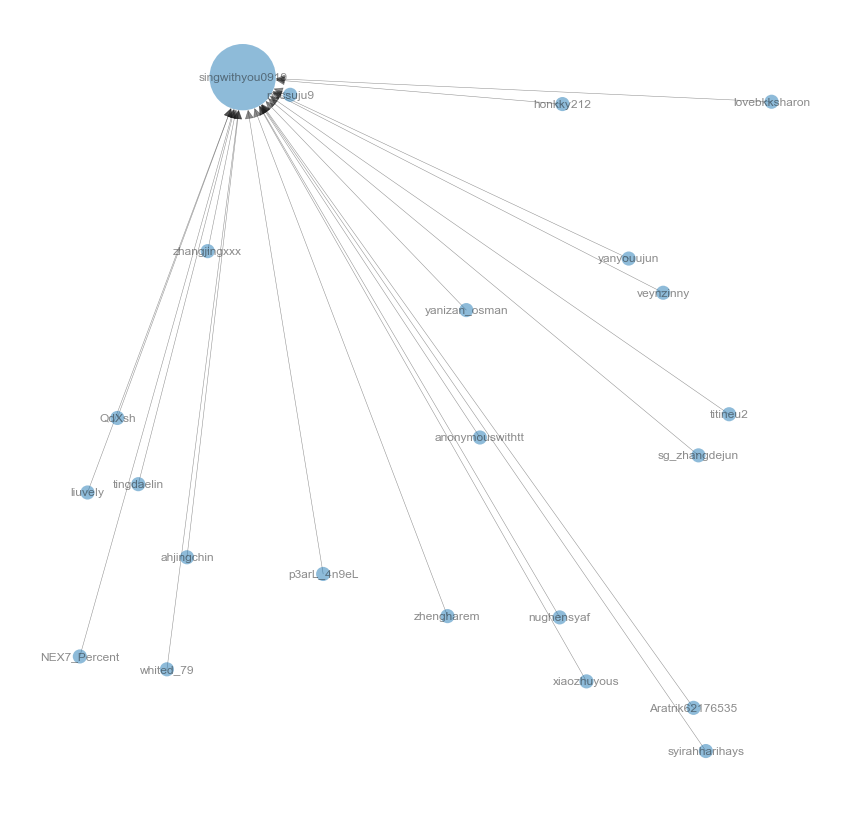

CommunityID:  17
0: 0.172*"plz" + 0.156*"gst" + 0.156*"launch" + 0.156*"2.0" + 0.156*"taxation" + 0.156*"issue" + 0.001*"loss" + 0.001*"report" + 0.001*"business" + 0.001*"thanks"
1: 0.047*"hindu" + 0.040*"caused" + 0.040*"hidden" + 0.040*"crucial" + 0.040*"risk" + 0.040*"nature" + 0.040*"thanks" + 0.040*"business" + 0.040*"report" + 0.040*"loss"


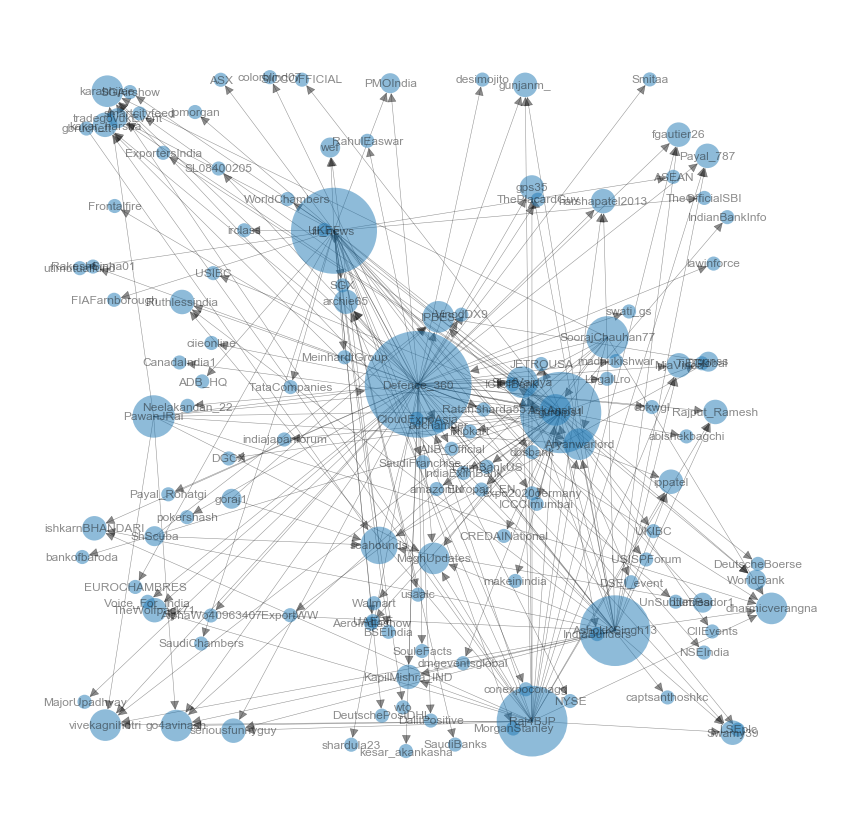

CommunityID:  20
0: 0.193*"he…" + 0.033*"fight" + 0.033*"🤧wonho" + 0.033*"😭🙏❤" + 0.033*"work" + 0.033*"bullying" + 0.033*"time" + 0.033*"chaotic" + 0.033*"think" + 0.033*"😅"
1: 0.084*"support" + 0.076*"x" + 0.044*"reinstatement" + 0.044*"wonhois…" + 0.044*"monsta" + 0.036*"reply" + 0.028*"mbbs" + 0.028*"u" + 0.020*"mx7" + 0.020*"close"


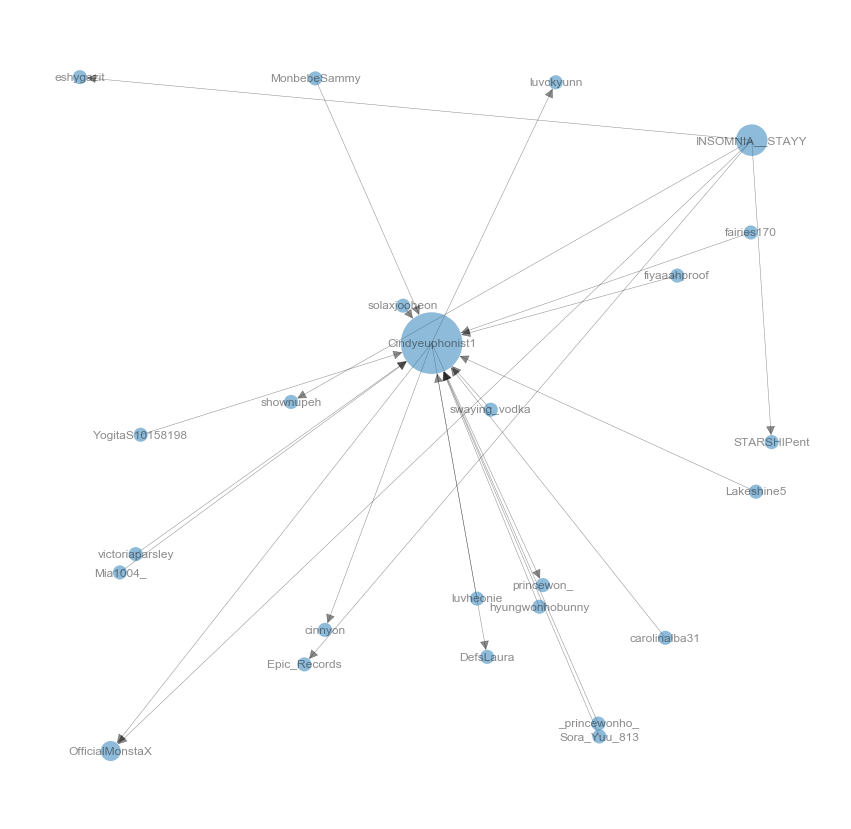

In [879]:
for i in pos_communities_list:
    print("CommunityID: ", int(i))
    
    # Deriving a subset of the dataframe using the above list
    tweets_unique_sample = tweets_mw_df_sent_topic_communityID[tweets_mw_df_sent_topic_communityID["CommunityID"] == i]

    # Converting the df clumn of noURLnoMention into a list 
    noURLnoMention_list_A = tweets_unique_sample['noURLnoMention'].tolist()

    # Using our "process_alltweets" functions
    processed = process_alltweets_updated(noURLnoMention_list_A)

    #Your code here to tokenize the processed tweets. ##
    vect_df_token = [word_tokenize(sentence) for sentence in processed]
    dictionary =  gensim.corpora.Dictionary(vect_df_token)

    dictionary.filter_extremes(no_below = 0) # choosing to remove words that are lesser than 5 counts

    corpus_vect = [dictionary.doc2bow(text) for text in vect_df_token]

    num_topics = 2
    ldamodel = gensim.models.ldamodel.LdaModel(corpus_vect, 
                                               num_topics = num_topics, 
                                               id2word=dictionary, 
                                               passes=20, 
                                               random_state= 0)

    for num ,topic in ldamodel.show_topics(formatted=True, num_topics=num_topics, num_words=10):
        print(str(num)+": "+ topic)

    G_sg = G.subgraph(top_communities[int(i)])

    # Create random layout positions
    pos = nx.random_layout(G_sg)

    # Figure Size
    plt.figure(figsize = (15,15))

    # Create size list
    sizes = [(v['degreeValues'] * 200) for (u, v) in G_sg.nodes(data=True)]
    # sizes = [x[1]*20 for x in G_sg.degree()]

    # Draw the network
    nx.draw_networkx(G_sg, pos, 
        with_labels = True, 
        node_size = sizes,
        width = 0.5, alpha = 0.5,
        arrowsize = 20, linewidths = 0)

    # Draw the axis based on their weights


    # Turn axis off and show
    plt.axis('off'); plt.show()


#### Observation from the following selected Communities:

##### Community 0:
In the midst of covid-19, there seems to be evidence that people agree with @NabaNaseer that the presence of covid-19 has its effects on mental wellness. Partly attributed to the stresses of getting it, as well as the social distancing. 

##### Community 1 (Sensitive to K-Pop):
This community is highly shaped by the Korean Pop Star community.. Languages used are very strong, which further emphasise how this community has it's mental wellness highly tied to the news of pop stars

##### Community 3 (Relationship issues):
Found a community of users who tend to agree with a couple of strong voices that echo sentiments of displeasure on people. Issues likely revolve relationships because it's always an emotional tie to partners, contains weddings, and ideas of looking pretty. 

##### Community 5 (Awareness issues):
A similar kind of community to 3, but with lesser relation to relationships. It has tweets with regards to awareness on this issue.

##### Community 6 (News Channel Community):
This community, as it's high in degree centrality nodes are news channels, reflect the current social issues that the world is facing - COVID 19. Perhaps the recency of news that is pulled means other topics are also retweeted (tho not reflective of the commmnity here) on bullying. 

##### Community 7 (A voice of self-caring):
A high in degree central node by the alias of @AChVoice had me deep diving. This user articulates #chronicillness from various #perspectives. This is a community that raises topics that promotes encouragement in the face of things that would impact one's mental wellness. 

##### Communiy 14 (celebrity):
This is a community that is retweeting on the safe returns of a celebrity in the face of COVID 19

##### Communiy 17 (celebrity):
This is a spam community.

##### Communiy 20 (celebrity):
A community that is unrelated to mental depression, but about a celebrity. Another spam community. 

In [882]:
pos_communities_list

[0.0, 1.0, 3.0, 5.0, 6.0, 7.0, 14.0, 17.0, 20.0]

In [893]:
# Deriving a subset of the dataframe using the above list
tweets_unique_sample = tweets_mw_df_sent_topic_communityID[tweets_mw_df_sent_topic_communityID["CommunityID"] == 20]
tweets_unique_sample["Text"].values

array(['RT @Cindyeuphonist1: #원호야_네_자리는_변함없이_여기있어\n#WishingForMonstaXAs7 \nMONBEBES! When wonho comes back! Our baby might be abit different like he…',
       'RT @Cindyeuphonist1: #원호야_네_자리는_변함없이_여기있어\n#WishingForMonstaXAs7 \nMONBEBES! When wonho comes back! Our baby might be abit different like he…',
       'RT @Cindyeuphonist1: #원호야_네_자리는_변함없이_여기있어\n#WishingForMonstaXAs7 \nMONBEBES! When wonho comes back! Our baby might be abit different like he…',
       'RT @Cindyeuphonist1: #원호야_네_자리는_변함없이_여기있어\n#WishingForMonstaXAs7 \nMONBEBES! When wonho comes back! Our baby might be abit different like he…',
       'RT @Cindyeuphonist1: #원호야_네_자리는_변함없이_여기있어\n#WishingForMonstaXAs7 \nMONBEBES! When wonho comes back! Our baby might be abit different like he…',
       'RT @Cindyeuphonist1: #원호야_네_자리는_변함없이_여기있어\n#WishingForMonstaXAs7 \nMONBEBES! When wonho comes back! Our baby might be abit different like he…',
       'RT @Cindyeuphonist1: #원호야_네_자리는_변함없이_여기있어\n#WishingForMonstaXAs7 \nMONBEBES! Whe